In [1]:
import numpy as np
import time
import os
import pandas as pd
import matplotlib.pyplot as plt

import cv2

import json
from urllib import request, parse

from PIL import Image
from matplotlib.patches import Ellipse, Circle

In [ ]:
# 原图 
# 10度

# 中心

# 标准 
# 放大 
# 缩小

# 原位 
# 左上 
# 右上 
# 左下 
# 右下

# 原图 
# 镜像

# 总数量 
# 2352=60 
# 统一最后大小300100

# 参数 
# image, xy=(x,y), zoom, offset

In [36]:
EYE_W = 300
EYE_H = 100
def getImage(imageFilePath):
    image = Image.open(imageFilePath)
    return image
def getFlag4Json(jsonFilePath):
    f = open(jsonFilePath, encoding='utf-8-sig')#注意需要设置格式     
    jsonData = json.load(f)
    face_rect = jsonData['face_rect']#脸位置大小 x y w h
    iris = jsonData['iris']#瞳孔位置半径 right:x y r left:x y r 注意是第一人称
    landmark = jsonData['landmark']#特征点坐标 眼部 24*2~32*2，眼角位置依次是：0 - 1 | 16 - 17
    flag = {
        'RAX':landmark[2*24+0*2],
        'RAY':landmark[2*24+0*2+1],
        'ROX':iris[0],
        'ROY':iris[1],
        'RBX':landmark[2*24+1*2],
        'RBY':landmark[2*24+1*2+1],
        'RUX':landmark[2*24+5*2],
        'RUY':landmark[2*24+5*2+1],
        'RDX':landmark[2*24+12*2],
        'RDY':landmark[2*24+12*2+1],
        
        'LAX':landmark[2*24+(1+16)*2],
        'LAY':landmark[2*24+(1+16)*2+1],
        'LOX':iris[3],
        'LOY':iris[4],
        'LBX':landmark[2*24+16*2],
        'LBY':landmark[2*24+16*2+1],
        'LUX':landmark[2*24+(5+16)*2],
        'LUY':landmark[2*24+(5+16)*2+1],
        'LDX':landmark[2*24+(12+16)*2],
        'LDY':landmark[2*24+(12+16)*2+1],
    }
    return flag#,face_rect, iris, landmark,jsonData
def getFace4Image(imageFilePath):
#     image = Image.open(imageFilePath)
    image  = cv2.imread(imageFilePath, cv2.IMREAD_COLOR)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    g = Image.fromarray(cv2.cvtColor(gray,cv2.COLOR_GRAY2RGB))
    faceCascade = cv2.CascadeClassifier('../model/haarcascade_frontalface_default.xml')
    faces = faceCascade.detectMultiScale(image, 1.2,2, cv2.CASCADE_SCALE_IMAGE,minSize=(100,100))
#     print('faceNum:', len(faces))
    x = 0
    y = 0
    w = 0
    h = 0
    if len(faces) > 0:
        size = 0
        max_id = 0
        for i in range(len(faces)):
            if size < faces[i][2]:
                size = faces[i][2]
                max_id = i
        x = faces[max_id][0]
        y = faces[max_id][1]
        w = faces[max_id][2]
        h = faces[max_id][3]

    return x,y,w,h

def getEye4Image(imageFilePath, zoom=(EYE_W,EYE_H)):
#     image = Image.open(imageFilePath)
    image  = cv2.imread(imageFilePath, cv2.IMREAD_COLOR)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    g = Image.fromarray(cv2.cvtColor(gray,cv2.COLOR_GRAY2RGB))
    faceCascade = cv2.CascadeClassifier('../model/haarcascade_frontalface_default.xml')
    faces = faceCascade.detectMultiScale(image, 1.1,2, cv2.CASCADE_SCALE_IMAGE,minSize=(150,150))
    eye = None
    
    if len(faces) > 0:
        
        n = len(faces) - 1
        x = faces[n][0]
        y = faces[n][1]
        w = faces[n][2]
        h = faces[n][3]
        
        w = w + (zoom[0]-EYE_W)
        x = int(x + w/8) - (zoom[0]-EYE_W)/2
        w = int(w - w/4)
        h = h + (zoom[1]-EYE_H)
        y = int(y + h/4) - (zoom[1]-EYE_H)/2
       
        h = int(h/4)
        eye = g.crop((x, y, x+w, y+h))
        eye = eye.resize(zoom,Image.ANTIALIAS)
    return eye,x,y, w, h

def displayImage(image):
    plt.axis('off')
    plt.figure(figsize=(6,2))
    ax = plt.subplot(121)
    plt.imshow(image)
    plt.show()
    
def displayEye(eye,flag,x0,y0,w0,h0,zoom=(EYE_W,EYE_H),transpose=False):
    print(s.size)
    print(w0, h0)
    plt.axis('off')
    ax = plt.subplot(121)
    
    plt.imshow(eye)
    xyc = ['RAX','RAY','yellow',
          'ROX','ROY','red',
          'RBX','RBY','blue',
          'RUX','RUY','green',
          'RDX','RDY','aqua',
          
          'LAX','LAY','yellow',
          'LOX','LOY','red',
          'LBX','LBY','blue',
          'LUX','LUY','green',
          'LDX','LDY','aqua'
         ]
    print(transpose)
    if transpose == True:
        for i in range(2):
            x = flag[xyc[i*3]] - x0
            y = flag[xyc[i*3+1]] - y0
            x = x*zoom[0]/w0
            y = y*zoom[1]/h0
            plt.plot(x, y,'.',label='point',color=xyc[i*3+2])
    else :
        for i in range(10):
            x = flag[xyc[i*3]] - x0
            y = flag[xyc[i*3+1]] - y0
            x = x*zoom[0]/w0
            y = y*zoom[1]/h0
            plt.plot(x, y,'.',label='point',color=xyc[i*3+2])    
    plt.show()
    
def getEyeDataFlag(image, face=(0,0,300,300), flag=None, zoom=1.0, offset=(0,0)):
    x = int(face[0] + face[2]/2.0 + 0.5 + offset[0])
    y = int(face[1] + face[3]/2.0 + 0.5 + offset[1])
    eyeH = int(face[3]*zoom/4.0 + 0.5)
    eyeW = int(eyeH*3 + 0.5)
    
    eyeX = int(x-eyeW/2 + 0.5)
    eyeY = int(y-eyeH + 0.5)
    eyeBox = (eyeX, eyeY, eyeX+eyeW, eyeY+eyeH)

    print('eyeWH:', eyeW, eyeH)
    print('faceWH:', face[2], face[3])
    print('faceXY:', x, y)
    print('eyeXY:', eyeX, eyeY)
    eyeImage = image.crop(eyeBox)
    eyeImage = eyeImage.resize((EYE_W,EYE_H),Image.ANTIALIAS)
    eyeGray = eyeImage.convert('L')
    eyeGrayLA = eyeImage.convert('LA')
    faceImage = image.crop((face[0], face[1], face[0]+face[2], face[1]+face[3]))
#     displayImage(eyeImage)
    
    plt.figure(figsize=(6,2))
    ax = plt.subplot(121)
    plt.imshow(eyeGrayLA)

    xyc = ['RAX','RAY','yellow',
          'ROX','ROY','red',
          'RBX','RBY','blue',
          'RUX','RUY','green',
          'RDX','RDY','aqua',
          
          'LAX','LAY','yellow',
          'LOX','LOY','red',
          'LBX','LBY','blue',
          'LUX','LUY','green',
          'LDX','LDY','aqua'
         ]
    if flag != None:
        eyeFlag = flag.copy()
        for i in range(10):
            px = flag[xyc[i*3]] - eyeX
            py = flag[xyc[i*3+1]] - eyeY
            px = px*EYE_W/eyeW
            py = py*EYE_H/eyeH
            eyeFlag[xyc[i*3]] = px
            eyeFlag[xyc[i*3+1]] = py
            plt.plot(int(px), int(py), '.', label='point', color=xyc[i*3+2])
    else:
        eyeFlag = None
    plt.show()
#     eyeGray.save('../data/eye/001.jpg', 'JPEG')
#     eyeData = np.array(eyeGray)
#     print(eyeData.size)
    return eyeGray, eyeFlag

def data2csv(data, labels):
    col = [
    'RAX','RAY',
    'ROX','ROY',
    'RBX','RBY',
    'RUX','RUY',
    'RDX','RDY',

    'LAX','LAY',
    'LOX','LOY',
    'LBX','LBY',
    'LUX','LUY',
    'LDX','LDY',
    ]
    
    results = pd.DataFrame(labels, columns = col)
    results.insert(len(col), 'data', data)
    results.to_csv('../data/data-eye.csv', index=False)
    

In [30]:
# def rotation(fileName, angle):
#     img = Image.open('../data/images/' + fileName + '.jpg')
#     img_rotate = img.rotate(angle) 
#     img_rotate.save('../data/images/' + fileName + '_r.jpg')
# name_angle = [
#     [1, -5],
#     [2, 5],
#     [3, 5],
#     [4, 5],
#     [5, 5],
#     [6, 5],
#     [7, 5],
#     [8, 5],
#     [9, 5],
#     [10, 5],
#     [11, 5],
#     [12, 5],
#     [13, 5],
#     [14, 5],
#     [15, 5],
#     [16, -5],
#     [17, -5],
#     [18, -5],
#     [19, -5],
#     [20, -5],
#     [21, -5],
#     [22, -5],
# ]
# for i in range(22):
#     if i<9:
#         rotation('00'+str(name_angle[i][0]), name_angle[i][1])
#     else:
#         rotation('0'+str(name_angle[i][0]), name_angle[i][1])

In [41]:
data_list = []
label_list = []
data_list.clear()
label_list.clear()
rs = [
    '',
    '_r'
]
zooms = [
    0.9,
    1.0,
    1.1
]
offsets = [
    (-5,-5),
    (5,-5),
    (0,0),
    (-5,5),
    (5,5)
]

In [37]:
# for i in range(22):
#     if i<9:
#         name = '../data/images/00' + str(i+1)
#     else:
#         name = '../data/images/0' + str(i+1)
    
#     face = getFace4Image(name + '.jpg')
#     print(str(i+1), face)
#     image = getImage(name + '.jpg')
#     image.save(name + '.jpg')

1 (234, 155, 345, 345)
2 (174, 94, 368, 368)
3 (212, 138, 278, 278)
4 (211, 146, 282, 282)
5 (178, 77, 395, 395)
6 (242, 168, 304, 304)
7 (259, 160, 310, 310)
8 (276, 153, 248, 248)
9 (271, 154, 235, 235)
10 (285, 110, 263, 263)
11 (289, 113, 263, 263)
12 (230, 83, 277, 277)
13 (263, 85, 258, 258)
14 (253, 88, 254, 254)
15 (279, 127, 234, 234)
16 (298, 110, 254, 254)
17 (291, 111, 251, 251)
18 (23, 197, 497, 497)
19 (30, 192, 485, 485)
20 (29, 197, 492, 492)
21 (23, 191, 500, 500)
22 (25, 190, 497, 497)


1  0.9 (-5, -5)
eyeWH: 234 78
faceWH: 345 345
faceXY: 402 323
eyeXY: 285 245


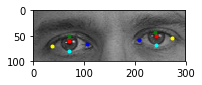

2  0.9 (-5, -5)
eyeWH: 249 83
faceWH: 368 368
faceXY: 353 273
eyeXY: 229 190


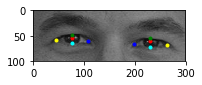

3  0.9 (-5, -5)
eyeWH: 189 63
faceWH: 278 278
faceXY: 346 272
eyeXY: 252 209


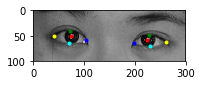

4  0.9 (-5, -5)
eyeWH: 189 63
faceWH: 282 282
faceXY: 347 282
eyeXY: 253 219


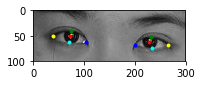

5  0.9 (-5, -5)
eyeWH: 267 89
faceWH: 395 395
faceXY: 371 270
eyeXY: 238 181


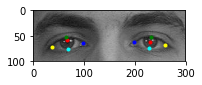

6  0.9 (-5, -5)
eyeWH: 204 68
faceWH: 304 304
faceXY: 389 315
eyeXY: 287 247


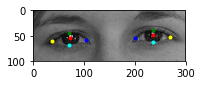

7  0.9 (-5, -5)
eyeWH: 210 70
faceWH: 310 310
faceXY: 409 310
eyeXY: 304 240


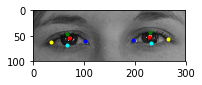

8  0.9 (-5, -5)
eyeWH: 168 56
faceWH: 248 248
faceXY: 395 272
eyeXY: 311 216


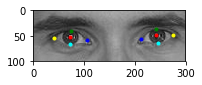

9  0.9 (-5, -5)
eyeWH: 159 53
faceWH: 235 235
faceXY: 384 267
eyeXY: 305 214


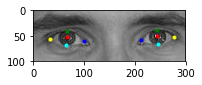

10  0.9 (-5, -5)
eyeWH: 177 59
faceWH: 263 263
faceXY: 412 237
eyeXY: 324 178


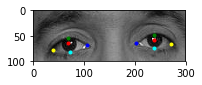

11  0.9 (-5, -5)
eyeWH: 177 59
faceWH: 263 263
faceXY: 416 240
eyeXY: 328 181


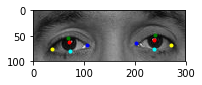

12  0.9 (-5, -5)
eyeWH: 186 62
faceWH: 277 277
faceXY: 364 217
eyeXY: 271 155


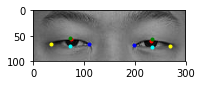

13  0.9 (-5, -5)
eyeWH: 174 58
faceWH: 258 258
faceXY: 387 209
eyeXY: 300 151


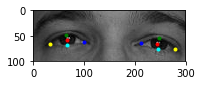

14  0.9 (-5, -5)
eyeWH: 171 57
faceWH: 254 254
faceXY: 375 210
eyeXY: 290 153


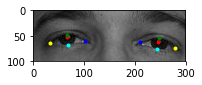

15  0.9 (-5, -5)
eyeWH: 159 53
faceWH: 234 234
faceXY: 391 239
eyeXY: 312 186


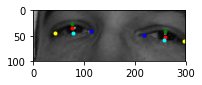

16  0.9 (-5, -5)
eyeWH: 171 57
faceWH: 254 254
faceXY: 420 232
eyeXY: 335 175


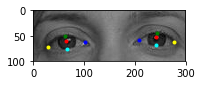

17  0.9 (-5, -5)
eyeWH: 168 56
faceWH: 251 251
faceXY: 412 232
eyeXY: 328 176


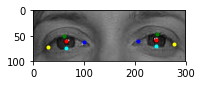

18  0.9 (-5, -5)
eyeWH: 336 112
faceWH: 497 497
faceXY: 267 441
eyeXY: 99 329


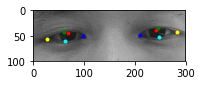

19  0.9 (-5, -5)
eyeWH: 327 109
faceWH: 485 485
faceXY: 268 430
eyeXY: 105 321


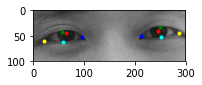

20  0.9 (-5, -5)
eyeWH: 333 111
faceWH: 492 492
faceXY: 270 438
eyeXY: 104 327


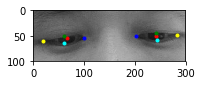

21  0.9 (-5, -5)
eyeWH: 339 113
faceWH: 500 500
faceXY: 268 436
eyeXY: 99 323


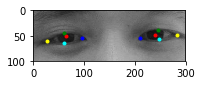

22  0.9 (-5, -5)
eyeWH: 336 112
faceWH: 497 497
faceXY: 269 434
eyeXY: 101 322


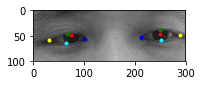

1  0.9 (5, -5)
eyeWH: 234 78
faceWH: 345 345
faceXY: 412 323
eyeXY: 295 245


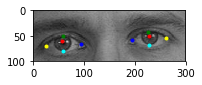

2  0.9 (5, -5)
eyeWH: 249 83
faceWH: 368 368
faceXY: 363 273
eyeXY: 239 190


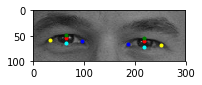

3  0.9 (5, -5)
eyeWH: 189 63
faceWH: 278 278
faceXY: 356 272
eyeXY: 262 209


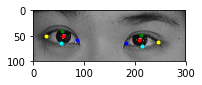

4  0.9 (5, -5)
eyeWH: 189 63
faceWH: 282 282
faceXY: 357 282
eyeXY: 263 219


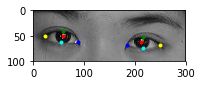

5  0.9 (5, -5)
eyeWH: 267 89
faceWH: 395 395
faceXY: 381 270
eyeXY: 248 181


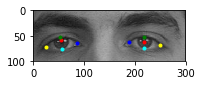

6  0.9 (5, -5)
eyeWH: 204 68
faceWH: 304 304
faceXY: 399 315
eyeXY: 297 247


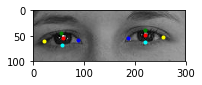

7  0.9 (5, -5)
eyeWH: 210 70
faceWH: 310 310
faceXY: 419 310
eyeXY: 314 240


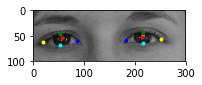

8  0.9 (5, -5)
eyeWH: 168 56
faceWH: 248 248
faceXY: 405 272
eyeXY: 321 216


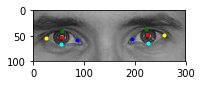

9  0.9 (5, -5)
eyeWH: 159 53
faceWH: 235 235
faceXY: 394 267
eyeXY: 315 214


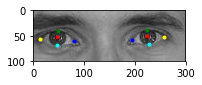

10  0.9 (5, -5)
eyeWH: 177 59
faceWH: 263 263
faceXY: 422 237
eyeXY: 334 178


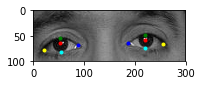

11  0.9 (5, -5)
eyeWH: 177 59
faceWH: 263 263
faceXY: 426 240
eyeXY: 338 181


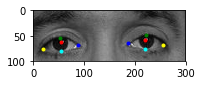

12  0.9 (5, -5)
eyeWH: 186 62
faceWH: 277 277
faceXY: 374 217
eyeXY: 281 155


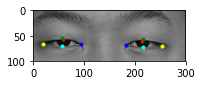

13  0.9 (5, -5)
eyeWH: 174 58
faceWH: 258 258
faceXY: 397 209
eyeXY: 310 151


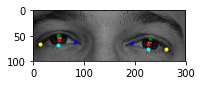

14  0.9 (5, -5)
eyeWH: 171 57
faceWH: 254 254
faceXY: 385 210
eyeXY: 300 153


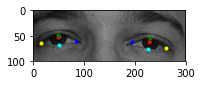

15  0.9 (5, -5)
eyeWH: 159 53
faceWH: 234 234
faceXY: 401 239
eyeXY: 322 186


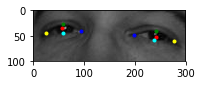

16  0.9 (5, -5)
eyeWH: 171 57
faceWH: 254 254
faceXY: 430 232
eyeXY: 345 175


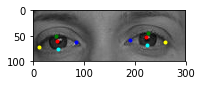

17  0.9 (5, -5)
eyeWH: 168 56
faceWH: 251 251
faceXY: 422 232
eyeXY: 338 176


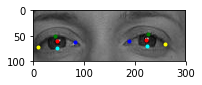

18  0.9 (5, -5)
eyeWH: 336 112
faceWH: 497 497
faceXY: 277 441
eyeXY: 109 329


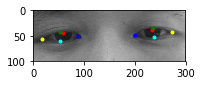

19  0.9 (5, -5)
eyeWH: 327 109
faceWH: 485 485
faceXY: 278 430
eyeXY: 115 321


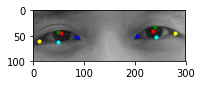

20  0.9 (5, -5)
eyeWH: 333 111
faceWH: 492 492
faceXY: 280 438
eyeXY: 114 327


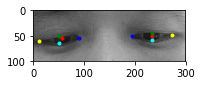

21  0.9 (5, -5)
eyeWH: 339 113
faceWH: 500 500
faceXY: 278 436
eyeXY: 109 323


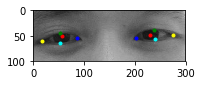

22  0.9 (5, -5)
eyeWH: 336 112
faceWH: 497 497
faceXY: 279 434
eyeXY: 111 322


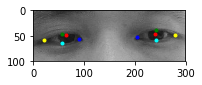

1  0.9 (0, 0)
eyeWH: 234 78
faceWH: 345 345
faceXY: 407 328
eyeXY: 290 250


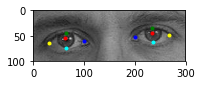

2  0.9 (0, 0)
eyeWH: 249 83
faceWH: 368 368
faceXY: 358 278
eyeXY: 234 195


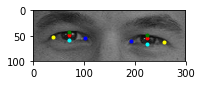

3  0.9 (0, 0)
eyeWH: 189 63
faceWH: 278 278
faceXY: 351 277
eyeXY: 257 214


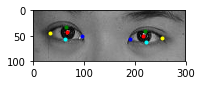

4  0.9 (0, 0)
eyeWH: 189 63
faceWH: 282 282
faceXY: 352 287
eyeXY: 258 224


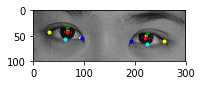

5  0.9 (0, 0)
eyeWH: 267 89
faceWH: 395 395
faceXY: 376 275
eyeXY: 243 186


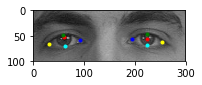

6  0.9 (0, 0)
eyeWH: 204 68
faceWH: 304 304
faceXY: 394 320
eyeXY: 292 252


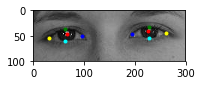

7  0.9 (0, 0)
eyeWH: 210 70
faceWH: 310 310
faceXY: 414 315
eyeXY: 309 245


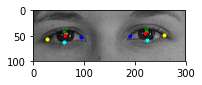

8  0.9 (0, 0)
eyeWH: 168 56
faceWH: 248 248
faceXY: 400 277
eyeXY: 316 221


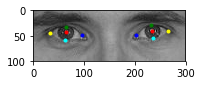

9  0.9 (0, 0)
eyeWH: 159 53
faceWH: 235 235
faceXY: 389 272
eyeXY: 310 219


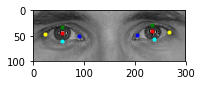

10  0.9 (0, 0)
eyeWH: 177 59
faceWH: 263 263
faceXY: 417 242
eyeXY: 329 183


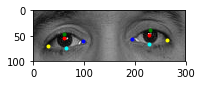

11  0.9 (0, 0)
eyeWH: 177 59
faceWH: 263 263
faceXY: 421 245
eyeXY: 333 186


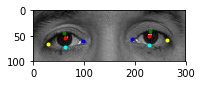

12  0.9 (0, 0)
eyeWH: 186 62
faceWH: 277 277
faceXY: 369 222
eyeXY: 276 160


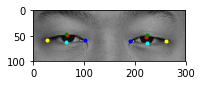

13  0.9 (0, 0)
eyeWH: 174 58
faceWH: 258 258
faceXY: 392 214
eyeXY: 305 156


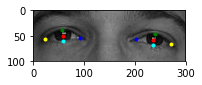

14  0.9 (0, 0)
eyeWH: 171 57
faceWH: 254 254
faceXY: 380 215
eyeXY: 295 158


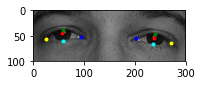

15  0.9 (0, 0)
eyeWH: 159 53
faceWH: 234 234
faceXY: 396 244
eyeXY: 317 191


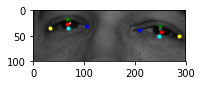

16  0.9 (0, 0)
eyeWH: 171 57
faceWH: 254 254
faceXY: 425 237
eyeXY: 340 180


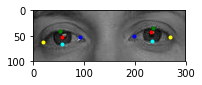

17  0.9 (0, 0)
eyeWH: 168 56
faceWH: 251 251
faceXY: 417 237
eyeXY: 333 181


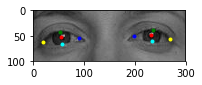

18  0.9 (0, 0)
eyeWH: 336 112
faceWH: 497 497
faceXY: 272 446
eyeXY: 104 334


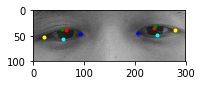

19  0.9 (0, 0)
eyeWH: 327 109
faceWH: 485 485
faceXY: 273 435
eyeXY: 110 326


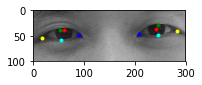

20  0.9 (0, 0)
eyeWH: 333 111
faceWH: 492 492
faceXY: 275 443
eyeXY: 109 332


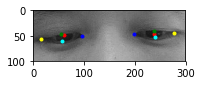

21  0.9 (0, 0)
eyeWH: 339 113
faceWH: 500 500
faceXY: 273 441
eyeXY: 104 328


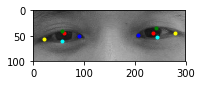

22  0.9 (0, 0)
eyeWH: 336 112
faceWH: 497 497
faceXY: 274 439
eyeXY: 106 327


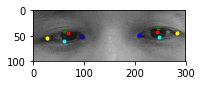

1  0.9 (-5, 5)
eyeWH: 234 78
faceWH: 345 345
faceXY: 402 333
eyeXY: 285 255


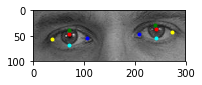

2  0.9 (-5, 5)
eyeWH: 249 83
faceWH: 368 368
faceXY: 353 283
eyeXY: 229 200


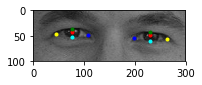

3  0.9 (-5, 5)
eyeWH: 189 63
faceWH: 278 278
faceXY: 346 282
eyeXY: 252 219


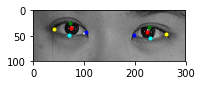

4  0.9 (-5, 5)
eyeWH: 189 63
faceWH: 282 282
faceXY: 347 292
eyeXY: 253 229


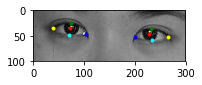

5  0.9 (-5, 5)
eyeWH: 267 89
faceWH: 395 395
faceXY: 371 280
eyeXY: 238 191


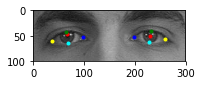

6  0.9 (-5, 5)
eyeWH: 204 68
faceWH: 304 304
faceXY: 389 325
eyeXY: 287 257


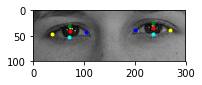

7  0.9 (-5, 5)
eyeWH: 210 70
faceWH: 310 310
faceXY: 409 320
eyeXY: 304 250


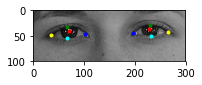

8  0.9 (-5, 5)
eyeWH: 168 56
faceWH: 248 248
faceXY: 395 282
eyeXY: 311 226


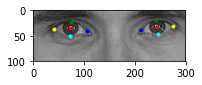

9  0.9 (-5, 5)
eyeWH: 159 53
faceWH: 235 235
faceXY: 384 277
eyeXY: 305 224


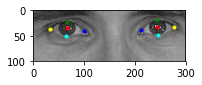

10  0.9 (-5, 5)
eyeWH: 177 59
faceWH: 263 263
faceXY: 412 247
eyeXY: 324 188


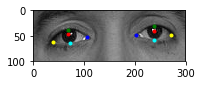

11  0.9 (-5, 5)
eyeWH: 177 59
faceWH: 263 263
faceXY: 416 250
eyeXY: 328 191


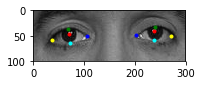

12  0.9 (-5, 5)
eyeWH: 186 62
faceWH: 277 277
faceXY: 364 227
eyeXY: 271 165


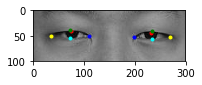

13  0.9 (-5, 5)
eyeWH: 174 58
faceWH: 258 258
faceXY: 387 219
eyeXY: 300 161


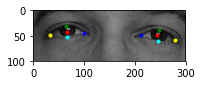

14  0.9 (-5, 5)
eyeWH: 171 57
faceWH: 254 254
faceXY: 375 220
eyeXY: 290 163


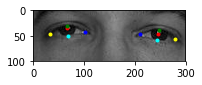

15  0.9 (-5, 5)
eyeWH: 159 53
faceWH: 234 234
faceXY: 391 249
eyeXY: 312 196


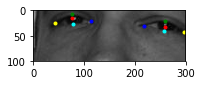

16  0.9 (-5, 5)
eyeWH: 171 57
faceWH: 254 254
faceXY: 420 242
eyeXY: 335 185


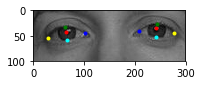

17  0.9 (-5, 5)
eyeWH: 168 56
faceWH: 251 251
faceXY: 412 242
eyeXY: 328 186


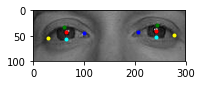

18  0.9 (-5, 5)
eyeWH: 336 112
faceWH: 497 497
faceXY: 267 451
eyeXY: 99 339


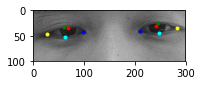

19  0.9 (-5, 5)
eyeWH: 327 109
faceWH: 485 485
faceXY: 268 440
eyeXY: 105 331


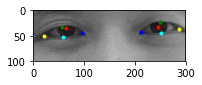

20  0.9 (-5, 5)
eyeWH: 333 111
faceWH: 492 492
faceXY: 270 448
eyeXY: 104 337


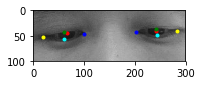

21  0.9 (-5, 5)
eyeWH: 339 113
faceWH: 500 500
faceXY: 268 446
eyeXY: 99 333


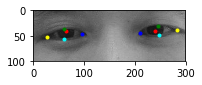

22  0.9 (-5, 5)
eyeWH: 336 112
faceWH: 497 497
faceXY: 269 444
eyeXY: 101 332


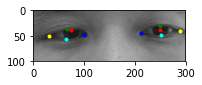

1  0.9 (5, 5)
eyeWH: 234 78
faceWH: 345 345
faceXY: 412 333
eyeXY: 295 255


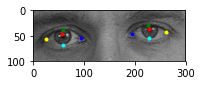

2  0.9 (5, 5)
eyeWH: 249 83
faceWH: 368 368
faceXY: 363 283
eyeXY: 239 200


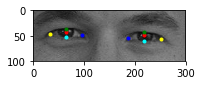

3  0.9 (5, 5)
eyeWH: 189 63
faceWH: 278 278
faceXY: 356 282
eyeXY: 262 219


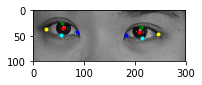

4  0.9 (5, 5)
eyeWH: 189 63
faceWH: 282 282
faceXY: 357 292
eyeXY: 263 229


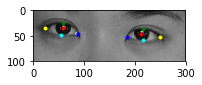

5  0.9 (5, 5)
eyeWH: 267 89
faceWH: 395 395
faceXY: 381 280
eyeXY: 248 191


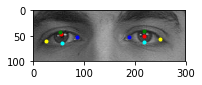

6  0.9 (5, 5)
eyeWH: 204 68
faceWH: 304 304
faceXY: 399 325
eyeXY: 297 257


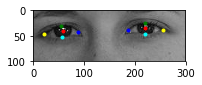

7  0.9 (5, 5)
eyeWH: 210 70
faceWH: 310 310
faceXY: 419 320
eyeXY: 314 250


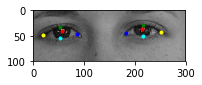

8  0.9 (5, 5)
eyeWH: 168 56
faceWH: 248 248
faceXY: 405 282
eyeXY: 321 226


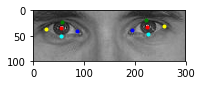

9  0.9 (5, 5)
eyeWH: 159 53
faceWH: 235 235
faceXY: 394 277
eyeXY: 315 224


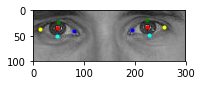

10  0.9 (5, 5)
eyeWH: 177 59
faceWH: 263 263
faceXY: 422 247
eyeXY: 334 188


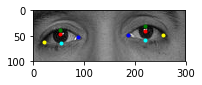

11  0.9 (5, 5)
eyeWH: 177 59
faceWH: 263 263
faceXY: 426 250
eyeXY: 338 191


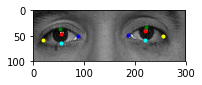

12  0.9 (5, 5)
eyeWH: 186 62
faceWH: 277 277
faceXY: 374 227
eyeXY: 281 165


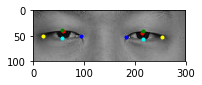

13  0.9 (5, 5)
eyeWH: 174 58
faceWH: 258 258
faceXY: 397 219
eyeXY: 310 161


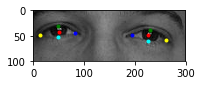

14  0.9 (5, 5)
eyeWH: 171 57
faceWH: 254 254
faceXY: 385 220
eyeXY: 300 163


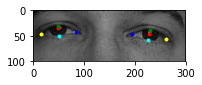

15  0.9 (5, 5)
eyeWH: 159 53
faceWH: 234 234
faceXY: 401 249
eyeXY: 322 196


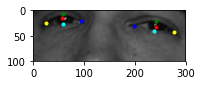

16  0.9 (5, 5)
eyeWH: 171 57
faceWH: 254 254
faceXY: 430 242
eyeXY: 345 185


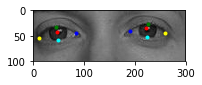

17  0.9 (5, 5)
eyeWH: 168 56
faceWH: 251 251
faceXY: 422 242
eyeXY: 338 186


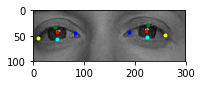

18  0.9 (5, 5)
eyeWH: 336 112
faceWH: 497 497
faceXY: 277 451
eyeXY: 109 339


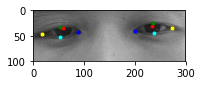

19  0.9 (5, 5)
eyeWH: 327 109
faceWH: 485 485
faceXY: 278 440
eyeXY: 115 331


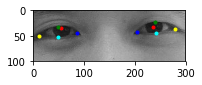

20  0.9 (5, 5)
eyeWH: 333 111
faceWH: 492 492
faceXY: 280 448
eyeXY: 114 337


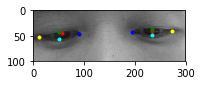

21  0.9 (5, 5)
eyeWH: 339 113
faceWH: 500 500
faceXY: 278 446
eyeXY: 109 333


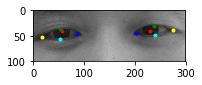

22  0.9 (5, 5)
eyeWH: 336 112
faceWH: 497 497
faceXY: 279 444
eyeXY: 111 332


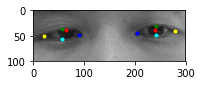

1  1.0 (-5, -5)
eyeWH: 258 86
faceWH: 345 345
faceXY: 402 323
eyeXY: 273 237


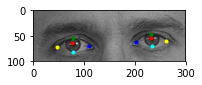

2  1.0 (-5, -5)
eyeWH: 276 92
faceWH: 368 368
faceXY: 353 273
eyeXY: 215 181


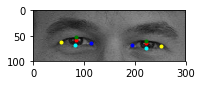

3  1.0 (-5, -5)
eyeWH: 210 70
faceWH: 278 278
faceXY: 346 272
eyeXY: 241 202


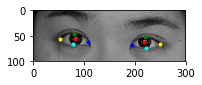

4  1.0 (-5, -5)
eyeWH: 213 71
faceWH: 282 282
faceXY: 347 282
eyeXY: 241 211


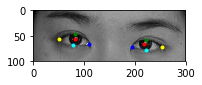

5  1.0 (-5, -5)
eyeWH: 297 99
faceWH: 395 395
faceXY: 371 270
eyeXY: 223 171


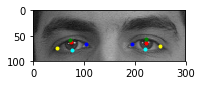

6  1.0 (-5, -5)
eyeWH: 228 76
faceWH: 304 304
faceXY: 389 315
eyeXY: 275 239


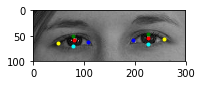

7  1.0 (-5, -5)
eyeWH: 234 78
faceWH: 310 310
faceXY: 409 310
eyeXY: 292 232


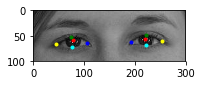

8  1.0 (-5, -5)
eyeWH: 186 62
faceWH: 248 248
faceXY: 395 272
eyeXY: 302 210


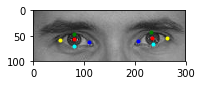

9  1.0 (-5, -5)
eyeWH: 177 59
faceWH: 235 235
faceXY: 384 267
eyeXY: 296 208


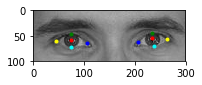

10  1.0 (-5, -5)
eyeWH: 198 66
faceWH: 263 263
faceXY: 412 237
eyeXY: 313 171


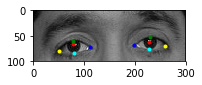

11  1.0 (-5, -5)
eyeWH: 198 66
faceWH: 263 263
faceXY: 416 240
eyeXY: 317 174


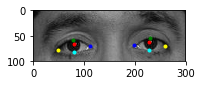

12  1.0 (-5, -5)
eyeWH: 207 69
faceWH: 277 277
faceXY: 364 217
eyeXY: 261 148


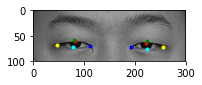

13  1.0 (-5, -5)
eyeWH: 195 65
faceWH: 258 258
faceXY: 387 209
eyeXY: 290 144


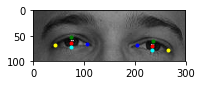

14  1.0 (-5, -5)
eyeWH: 192 64
faceWH: 254 254
faceXY: 375 210
eyeXY: 279 146


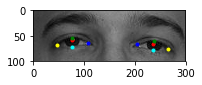

15  1.0 (-5, -5)
eyeWH: 177 59
faceWH: 234 234
faceXY: 391 239
eyeXY: 303 180


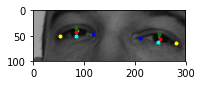

16  1.0 (-5, -5)
eyeWH: 192 64
faceWH: 254 254
faceXY: 420 232
eyeXY: 324 168


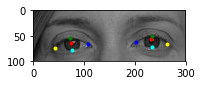

17  1.0 (-5, -5)
eyeWH: 189 63
faceWH: 251 251
faceXY: 412 232
eyeXY: 318 169


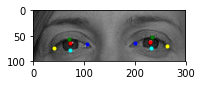

18  1.0 (-5, -5)
eyeWH: 372 124
faceWH: 497 497
faceXY: 267 441
eyeXY: 81 317


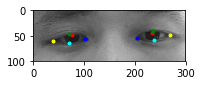

19  1.0 (-5, -5)
eyeWH: 363 121
faceWH: 485 485
faceXY: 268 430
eyeXY: 87 309


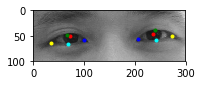

20  1.0 (-5, -5)
eyeWH: 369 123
faceWH: 492 492
faceXY: 270 438
eyeXY: 86 315


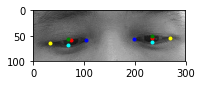

21  1.0 (-5, -5)
eyeWH: 375 125
faceWH: 500 500
faceXY: 268 436
eyeXY: 81 311


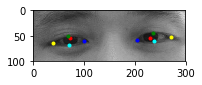

22  1.0 (-5, -5)
eyeWH: 372 124
faceWH: 497 497
faceXY: 269 434
eyeXY: 83 310


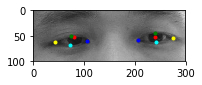

1  1.0 (5, -5)
eyeWH: 258 86
faceWH: 345 345
faceXY: 412 323
eyeXY: 283 237


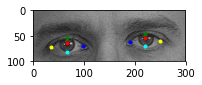

2  1.0 (5, -5)
eyeWH: 276 92
faceWH: 368 368
faceXY: 363 273
eyeXY: 225 181


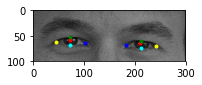

3  1.0 (5, -5)
eyeWH: 210 70
faceWH: 278 278
faceXY: 356 272
eyeXY: 251 202


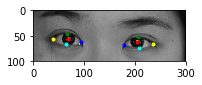

4  1.0 (5, -5)
eyeWH: 213 71
faceWH: 282 282
faceXY: 357 282
eyeXY: 251 211


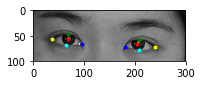

5  1.0 (5, -5)
eyeWH: 297 99
faceWH: 395 395
faceXY: 381 270
eyeXY: 233 171


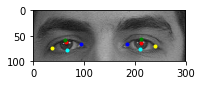

6  1.0 (5, -5)
eyeWH: 228 76
faceWH: 304 304
faceXY: 399 315
eyeXY: 285 239


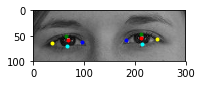

7  1.0 (5, -5)
eyeWH: 234 78
faceWH: 310 310
faceXY: 419 310
eyeXY: 302 232


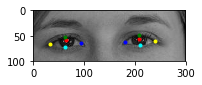

8  1.0 (5, -5)
eyeWH: 186 62
faceWH: 248 248
faceXY: 405 272
eyeXY: 312 210


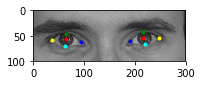

9  1.0 (5, -5)
eyeWH: 177 59
faceWH: 235 235
faceXY: 394 267
eyeXY: 306 208


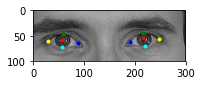

10  1.0 (5, -5)
eyeWH: 198 66
faceWH: 263 263
faceXY: 422 237
eyeXY: 323 171


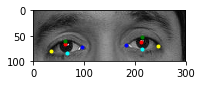

11  1.0 (5, -5)
eyeWH: 198 66
faceWH: 263 263
faceXY: 426 240
eyeXY: 327 174


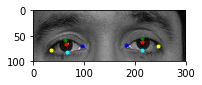

12  1.0 (5, -5)
eyeWH: 207 69
faceWH: 277 277
faceXY: 374 217
eyeXY: 271 148


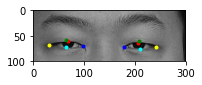

13  1.0 (5, -5)
eyeWH: 195 65
faceWH: 258 258
faceXY: 397 209
eyeXY: 300 144


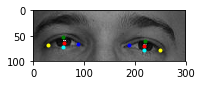

14  1.0 (5, -5)
eyeWH: 192 64
faceWH: 254 254
faceXY: 385 210
eyeXY: 289 146


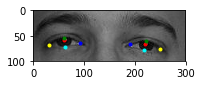

15  1.0 (5, -5)
eyeWH: 177 59
faceWH: 234 234
faceXY: 401 239
eyeXY: 313 180


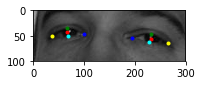

16  1.0 (5, -5)
eyeWH: 192 64
faceWH: 254 254
faceXY: 430 232
eyeXY: 334 168


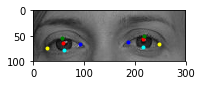

17  1.0 (5, -5)
eyeWH: 189 63
faceWH: 251 251
faceXY: 422 232
eyeXY: 328 169


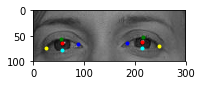

18  1.0 (5, -5)
eyeWH: 372 124
faceWH: 497 497
faceXY: 277 441
eyeXY: 91 317


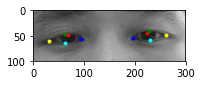

19  1.0 (5, -5)
eyeWH: 363 121
faceWH: 485 485
faceXY: 278 430
eyeXY: 97 309


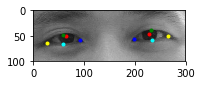

20  1.0 (5, -5)
eyeWH: 369 123
faceWH: 492 492
faceXY: 280 438
eyeXY: 96 315


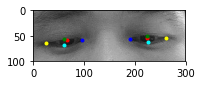

21  1.0 (5, -5)
eyeWH: 375 125
faceWH: 500 500
faceXY: 278 436
eyeXY: 91 311


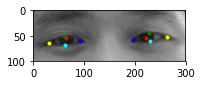

22  1.0 (5, -5)
eyeWH: 372 124
faceWH: 497 497
faceXY: 279 434
eyeXY: 93 310


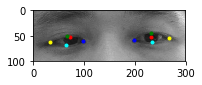

1  1.0 (0, 0)
eyeWH: 258 86
faceWH: 345 345
faceXY: 407 328
eyeXY: 278 242


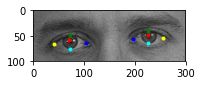

2  1.0 (0, 0)
eyeWH: 276 92
faceWH: 368 368
faceXY: 358 278
eyeXY: 220 186


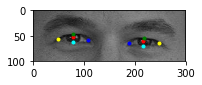

3  1.0 (0, 0)
eyeWH: 210 70
faceWH: 278 278
faceXY: 351 277
eyeXY: 246 207


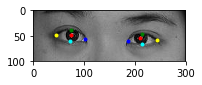

4  1.0 (0, 0)
eyeWH: 213 71
faceWH: 282 282
faceXY: 352 287
eyeXY: 246 216


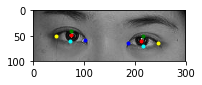

5  1.0 (0, 0)
eyeWH: 297 99
faceWH: 395 395
faceXY: 376 275
eyeXY: 228 176


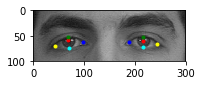

6  1.0 (0, 0)
eyeWH: 228 76
faceWH: 304 304
faceXY: 394 320
eyeXY: 280 244


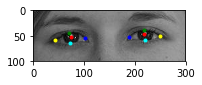

7  1.0 (0, 0)
eyeWH: 234 78
faceWH: 310 310
faceXY: 414 315
eyeXY: 297 237


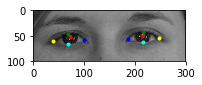

8  1.0 (0, 0)
eyeWH: 186 62
faceWH: 248 248
faceXY: 400 277
eyeXY: 307 215


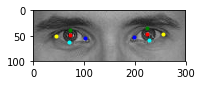

9  1.0 (0, 0)
eyeWH: 177 59
faceWH: 235 235
faceXY: 389 272
eyeXY: 301 213


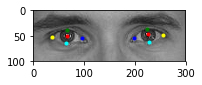

10  1.0 (0, 0)
eyeWH: 198 66
faceWH: 263 263
faceXY: 417 242
eyeXY: 318 176


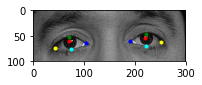

11  1.0 (0, 0)
eyeWH: 198 66
faceWH: 263 263
faceXY: 421 245
eyeXY: 322 179


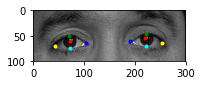

12  1.0 (0, 0)
eyeWH: 207 69
faceWH: 277 277
faceXY: 369 222
eyeXY: 266 153


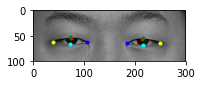

13  1.0 (0, 0)
eyeWH: 195 65
faceWH: 258 258
faceXY: 392 214
eyeXY: 295 149


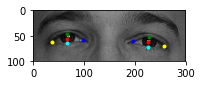

14  1.0 (0, 0)
eyeWH: 192 64
faceWH: 254 254
faceXY: 380 215
eyeXY: 284 151


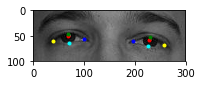

15  1.0 (0, 0)
eyeWH: 177 59
faceWH: 234 234
faceXY: 396 244
eyeXY: 308 185


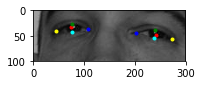

16  1.0 (0, 0)
eyeWH: 192 64
faceWH: 254 254
faceXY: 425 237
eyeXY: 329 173


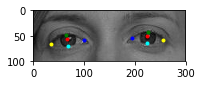

17  1.0 (0, 0)
eyeWH: 189 63
faceWH: 251 251
faceXY: 417 237
eyeXY: 323 174


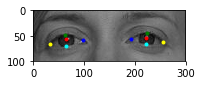

18  1.0 (0, 0)
eyeWH: 372 124
faceWH: 497 497
faceXY: 272 446
eyeXY: 86 322


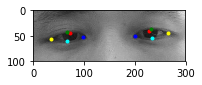

19  1.0 (0, 0)
eyeWH: 363 121
faceWH: 485 485
faceXY: 273 435
eyeXY: 92 314


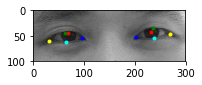

20  1.0 (0, 0)
eyeWH: 369 123
faceWH: 492 492
faceXY: 275 443
eyeXY: 91 320


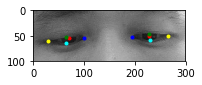

21  1.0 (0, 0)
eyeWH: 375 125
faceWH: 500 500
faceXY: 273 441
eyeXY: 86 316


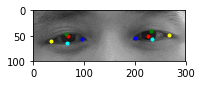

22  1.0 (0, 0)
eyeWH: 372 124
faceWH: 497 497
faceXY: 274 439
eyeXY: 88 315


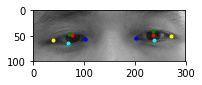

1  1.0 (-5, 5)
eyeWH: 258 86
faceWH: 345 345
faceXY: 402 333
eyeXY: 273 247


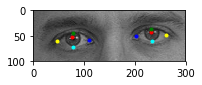

2  1.0 (-5, 5)
eyeWH: 276 92
faceWH: 368 368
faceXY: 353 283
eyeXY: 215 191


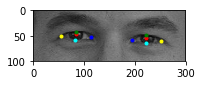

3  1.0 (-5, 5)
eyeWH: 210 70
faceWH: 278 278
faceXY: 346 282
eyeXY: 241 212


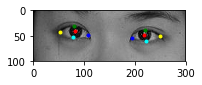

4  1.0 (-5, 5)
eyeWH: 213 71
faceWH: 282 282
faceXY: 347 292
eyeXY: 241 221


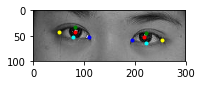

5  1.0 (-5, 5)
eyeWH: 297 99
faceWH: 395 395
faceXY: 371 280
eyeXY: 223 181


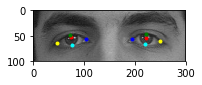

6  1.0 (-5, 5)
eyeWH: 228 76
faceWH: 304 304
faceXY: 389 325
eyeXY: 275 249


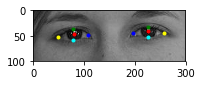

7  1.0 (-5, 5)
eyeWH: 234 78
faceWH: 310 310
faceXY: 409 320
eyeXY: 292 242


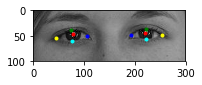

8  1.0 (-5, 5)
eyeWH: 186 62
faceWH: 248 248
faceXY: 395 282
eyeXY: 302 220


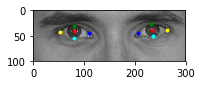

9  1.0 (-5, 5)
eyeWH: 177 59
faceWH: 235 235
faceXY: 384 277
eyeXY: 296 218


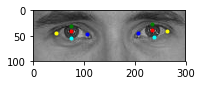

10  1.0 (-5, 5)
eyeWH: 198 66
faceWH: 263 263
faceXY: 412 247
eyeXY: 313 181


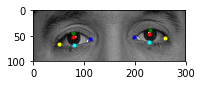

11  1.0 (-5, 5)
eyeWH: 198 66
faceWH: 263 263
faceXY: 416 250
eyeXY: 317 184


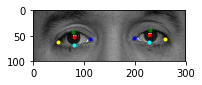

12  1.0 (-5, 5)
eyeWH: 207 69
faceWH: 277 277
faceXY: 364 227
eyeXY: 261 158


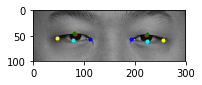

13  1.0 (-5, 5)
eyeWH: 195 65
faceWH: 258 258
faceXY: 387 219
eyeXY: 290 154


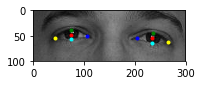

14  1.0 (-5, 5)
eyeWH: 192 64
faceWH: 254 254
faceXY: 375 220
eyeXY: 279 156


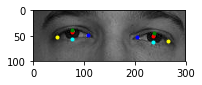

15  1.0 (-5, 5)
eyeWH: 177 59
faceWH: 234 234
faceXY: 391 249
eyeXY: 303 190


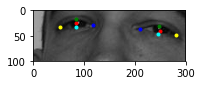

16  1.0 (-5, 5)
eyeWH: 192 64
faceWH: 254 254
faceXY: 420 242
eyeXY: 324 178


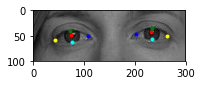

17  1.0 (-5, 5)
eyeWH: 189 63
faceWH: 251 251
faceXY: 412 242
eyeXY: 318 179


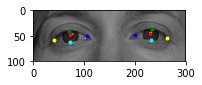

18  1.0 (-5, 5)
eyeWH: 372 124
faceWH: 497 497
faceXY: 267 451
eyeXY: 81 327


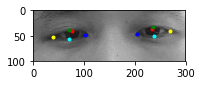

19  1.0 (-5, 5)
eyeWH: 363 121
faceWH: 485 485
faceXY: 268 440
eyeXY: 87 319


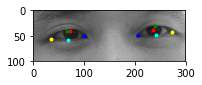

20  1.0 (-5, 5)
eyeWH: 369 123
faceWH: 492 492
faceXY: 270 448
eyeXY: 86 325


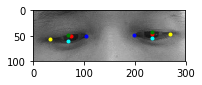

21  1.0 (-5, 5)
eyeWH: 375 125
faceWH: 500 500
faceXY: 268 446
eyeXY: 81 321


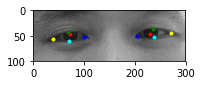

22  1.0 (-5, 5)
eyeWH: 372 124
faceWH: 497 497
faceXY: 269 444
eyeXY: 83 320


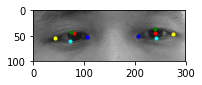

1  1.0 (5, 5)
eyeWH: 258 86
faceWH: 345 345
faceXY: 412 333
eyeXY: 283 247


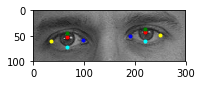

2  1.0 (5, 5)
eyeWH: 276 92
faceWH: 368 368
faceXY: 363 283
eyeXY: 225 191


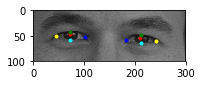

3  1.0 (5, 5)
eyeWH: 210 70
faceWH: 278 278
faceXY: 356 282
eyeXY: 251 212


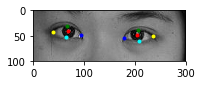

4  1.0 (5, 5)
eyeWH: 213 71
faceWH: 282 282
faceXY: 357 292
eyeXY: 251 221


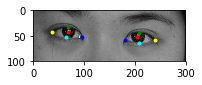

5  1.0 (5, 5)
eyeWH: 297 99
faceWH: 395 395
faceXY: 381 280
eyeXY: 233 181


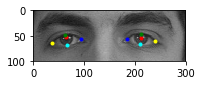

6  1.0 (5, 5)
eyeWH: 228 76
faceWH: 304 304
faceXY: 399 325
eyeXY: 285 249


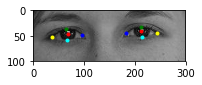

7  1.0 (5, 5)
eyeWH: 234 78
faceWH: 310 310
faceXY: 419 320
eyeXY: 302 242


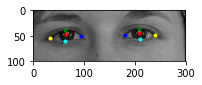

8  1.0 (5, 5)
eyeWH: 186 62
faceWH: 248 248
faceXY: 405 282
eyeXY: 312 220


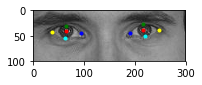

9  1.0 (5, 5)
eyeWH: 177 59
faceWH: 235 235
faceXY: 394 277
eyeXY: 306 218


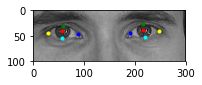

10  1.0 (5, 5)
eyeWH: 198 66
faceWH: 263 263
faceXY: 422 247
eyeXY: 323 181


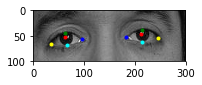

11  1.0 (5, 5)
eyeWH: 198 66
faceWH: 263 263
faceXY: 426 250
eyeXY: 327 184


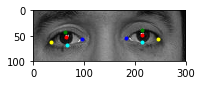

12  1.0 (5, 5)
eyeWH: 207 69
faceWH: 277 277
faceXY: 374 227
eyeXY: 271 158


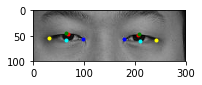

13  1.0 (5, 5)
eyeWH: 195 65
faceWH: 258 258
faceXY: 397 219
eyeXY: 300 154


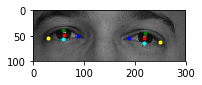

14  1.0 (5, 5)
eyeWH: 192 64
faceWH: 254 254
faceXY: 385 220
eyeXY: 289 156


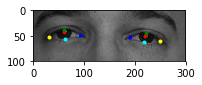

15  1.0 (5, 5)
eyeWH: 177 59
faceWH: 234 234
faceXY: 401 249
eyeXY: 313 190


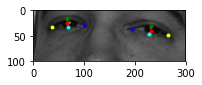

16  1.0 (5, 5)
eyeWH: 192 64
faceWH: 254 254
faceXY: 430 242
eyeXY: 334 178


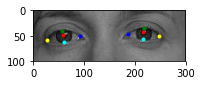

17  1.0 (5, 5)
eyeWH: 189 63
faceWH: 251 251
faceXY: 422 242
eyeXY: 328 179


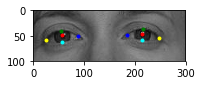

18  1.0 (5, 5)
eyeWH: 372 124
faceWH: 497 497
faceXY: 277 451
eyeXY: 91 327


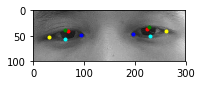

19  1.0 (5, 5)
eyeWH: 363 121
faceWH: 485 485
faceXY: 278 440
eyeXY: 97 319


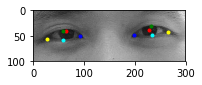

20  1.0 (5, 5)
eyeWH: 369 123
faceWH: 492 492
faceXY: 280 448
eyeXY: 96 325


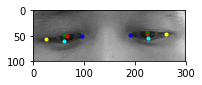

21  1.0 (5, 5)
eyeWH: 375 125
faceWH: 500 500
faceXY: 278 446
eyeXY: 91 321


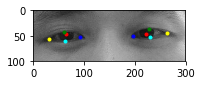

22  1.0 (5, 5)
eyeWH: 372 124
faceWH: 497 497
faceXY: 279 444
eyeXY: 93 320


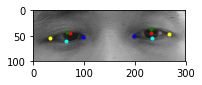

1  1.1 (-5, -5)
eyeWH: 285 95
faceWH: 345 345
faceXY: 402 323
eyeXY: 260 228


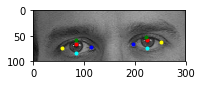

2  1.1 (-5, -5)
eyeWH: 303 101
faceWH: 368 368
faceXY: 353 273
eyeXY: 202 172


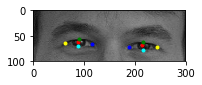

3  1.1 (-5, -5)
eyeWH: 228 76
faceWH: 278 278
faceXY: 346 272
eyeXY: 232 196


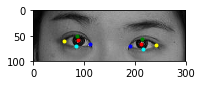

4  1.1 (-5, -5)
eyeWH: 234 78
faceWH: 282 282
faceXY: 347 282
eyeXY: 230 204


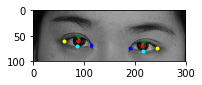

5  1.1 (-5, -5)
eyeWH: 327 109
faceWH: 395 395
faceXY: 371 270
eyeXY: 208 161


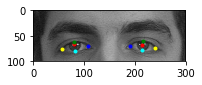

6  1.1 (-5, -5)
eyeWH: 252 84
faceWH: 304 304
faceXY: 389 315
eyeXY: 263 231


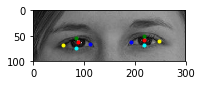

7  1.1 (-5, -5)
eyeWH: 255 85
faceWH: 310 310
faceXY: 409 310
eyeXY: 282 225


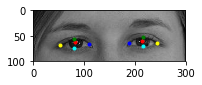

8  1.1 (-5, -5)
eyeWH: 204 68
faceWH: 248 248
faceXY: 395 272
eyeXY: 293 204


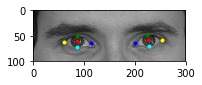

9  1.1 (-5, -5)
eyeWH: 195 65
faceWH: 235 235
faceXY: 384 267
eyeXY: 287 202


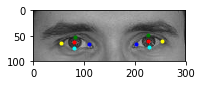

10  1.1 (-5, -5)
eyeWH: 216 72
faceWH: 263 263
faceXY: 412 237
eyeXY: 304 165


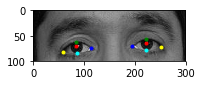

11  1.1 (-5, -5)
eyeWH: 216 72
faceWH: 263 263
faceXY: 416 240
eyeXY: 308 168


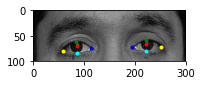

12  1.1 (-5, -5)
eyeWH: 228 76
faceWH: 277 277
faceXY: 364 217
eyeXY: 250 141


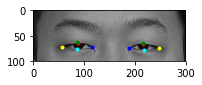

13  1.1 (-5, -5)
eyeWH: 213 71
faceWH: 258 258
faceXY: 387 209
eyeXY: 281 138


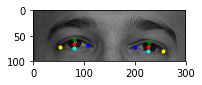

14  1.1 (-5, -5)
eyeWH: 210 70
faceWH: 254 254
faceXY: 375 210
eyeXY: 270 140


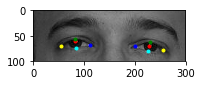

15  1.1 (-5, -5)
eyeWH: 192 64
faceWH: 234 234
faceXY: 391 239
eyeXY: 295 175


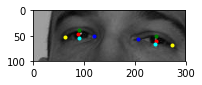

16  1.1 (-5, -5)
eyeWH: 210 70
faceWH: 254 254
faceXY: 420 232
eyeXY: 315 162


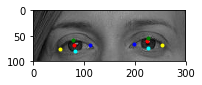

17  1.1 (-5, -5)
eyeWH: 207 69
faceWH: 251 251
faceXY: 412 232
eyeXY: 309 163


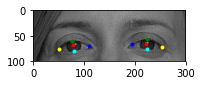

18  1.1 (-5, -5)
eyeWH: 411 137
faceWH: 497 497
faceXY: 267 441
eyeXY: 62 304


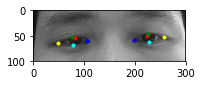

19  1.1 (-5, -5)
eyeWH: 399 133
faceWH: 485 485
faceXY: 268 430
eyeXY: 69 297


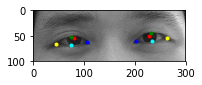

20  1.1 (-5, -5)
eyeWH: 405 135
faceWH: 492 492
faceXY: 270 438
eyeXY: 68 303


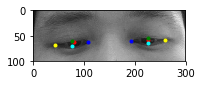

21  1.1 (-5, -5)
eyeWH: 414 138
faceWH: 500 500
faceXY: 268 436
eyeXY: 61 298


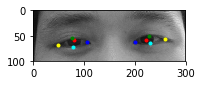

22  1.1 (-5, -5)
eyeWH: 411 137
faceWH: 497 497
faceXY: 269 434
eyeXY: 64 297


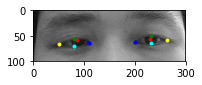

1  1.1 (5, -5)
eyeWH: 285 95
faceWH: 345 345
faceXY: 412 323
eyeXY: 270 228


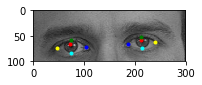

2  1.1 (5, -5)
eyeWH: 303 101
faceWH: 368 368
faceXY: 363 273
eyeXY: 212 172


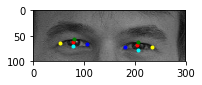

3  1.1 (5, -5)
eyeWH: 228 76
faceWH: 278 278
faceXY: 356 272
eyeXY: 242 196


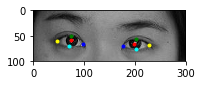

4  1.1 (5, -5)
eyeWH: 234 78
faceWH: 282 282
faceXY: 357 282
eyeXY: 240 204


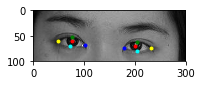

5  1.1 (5, -5)
eyeWH: 327 109
faceWH: 395 395
faceXY: 381 270
eyeXY: 218 161


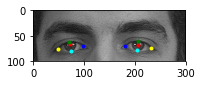

6  1.1 (5, -5)
eyeWH: 252 84
faceWH: 304 304
faceXY: 399 315
eyeXY: 273 231


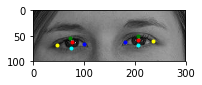

7  1.1 (5, -5)
eyeWH: 255 85
faceWH: 310 310
faceXY: 419 310
eyeXY: 292 225


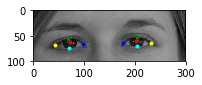

8  1.1 (5, -5)
eyeWH: 204 68
faceWH: 248 248
faceXY: 405 272
eyeXY: 303 204


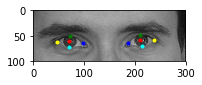

9  1.1 (5, -5)
eyeWH: 195 65
faceWH: 235 235
faceXY: 394 267
eyeXY: 297 202


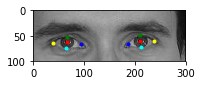

10  1.1 (5, -5)
eyeWH: 216 72
faceWH: 263 263
faceXY: 422 237
eyeXY: 314 165


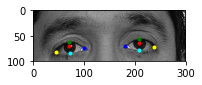

11  1.1 (5, -5)
eyeWH: 216 72
faceWH: 263 263
faceXY: 426 240
eyeXY: 318 168


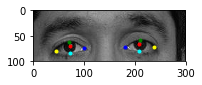

12  1.1 (5, -5)
eyeWH: 228 76
faceWH: 277 277
faceXY: 374 217
eyeXY: 260 141


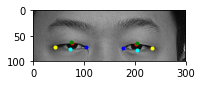

13  1.1 (5, -5)
eyeWH: 213 71
faceWH: 258 258
faceXY: 397 209
eyeXY: 291 138


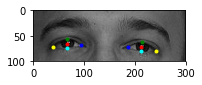

14  1.1 (5, -5)
eyeWH: 210 70
faceWH: 254 254
faceXY: 385 210
eyeXY: 280 140


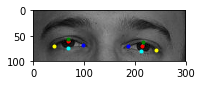

15  1.1 (5, -5)
eyeWH: 192 64
faceWH: 234 234
faceXY: 401 239
eyeXY: 305 175


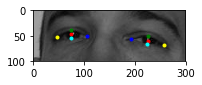

16  1.1 (5, -5)
eyeWH: 210 70
faceWH: 254 254
faceXY: 430 232
eyeXY: 325 162


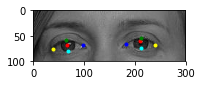

17  1.1 (5, -5)
eyeWH: 207 69
faceWH: 251 251
faceXY: 422 232
eyeXY: 319 163


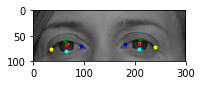

18  1.1 (5, -5)
eyeWH: 411 137
faceWH: 497 497
faceXY: 277 441
eyeXY: 72 304


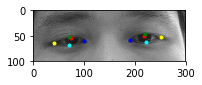

19  1.1 (5, -5)
eyeWH: 399 133
faceWH: 485 485
faceXY: 278 430
eyeXY: 79 297


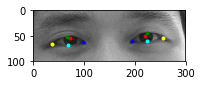

20  1.1 (5, -5)
eyeWH: 405 135
faceWH: 492 492
faceXY: 280 438
eyeXY: 78 303


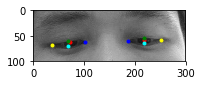

21  1.1 (5, -5)
eyeWH: 414 138
faceWH: 500 500
faceXY: 278 436
eyeXY: 71 298


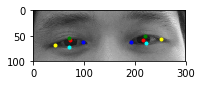

22  1.1 (5, -5)
eyeWH: 411 137
faceWH: 497 497
faceXY: 279 434
eyeXY: 74 297


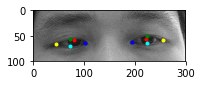

1  1.1 (0, 0)
eyeWH: 285 95
faceWH: 345 345
faceXY: 407 328
eyeXY: 265 233


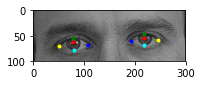

2  1.1 (0, 0)
eyeWH: 303 101
faceWH: 368 368
faceXY: 358 278
eyeXY: 207 177


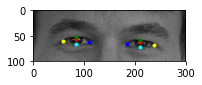

3  1.1 (0, 0)
eyeWH: 228 76
faceWH: 278 278
faceXY: 351 277
eyeXY: 237 201


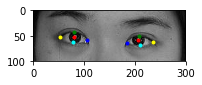

4  1.1 (0, 0)
eyeWH: 234 78
faceWH: 282 282
faceXY: 352 287
eyeXY: 235 209


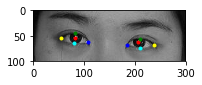

5  1.1 (0, 0)
eyeWH: 327 109
faceWH: 395 395
faceXY: 376 275
eyeXY: 213 166


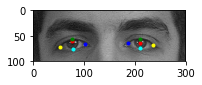

6  1.1 (0, 0)
eyeWH: 252 84
faceWH: 304 304
faceXY: 394 320
eyeXY: 268 236


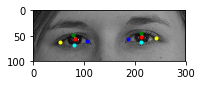

7  1.1 (0, 0)
eyeWH: 255 85
faceWH: 310 310
faceXY: 414 315
eyeXY: 287 230


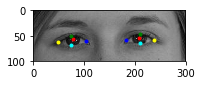

8  1.1 (0, 0)
eyeWH: 204 68
faceWH: 248 248
faceXY: 400 277
eyeXY: 298 209


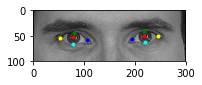

9  1.1 (0, 0)
eyeWH: 195 65
faceWH: 235 235
faceXY: 389 272
eyeXY: 292 207


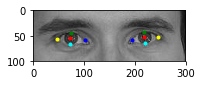

10  1.1 (0, 0)
eyeWH: 216 72
faceWH: 263 263
faceXY: 417 242
eyeXY: 309 170


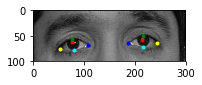

11  1.1 (0, 0)
eyeWH: 216 72
faceWH: 263 263
faceXY: 421 245
eyeXY: 313 173


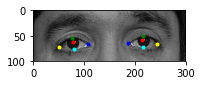

12  1.1 (0, 0)
eyeWH: 228 76
faceWH: 277 277
faceXY: 369 222
eyeXY: 255 146


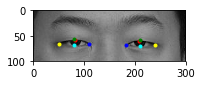

13  1.1 (0, 0)
eyeWH: 213 71
faceWH: 258 258
faceXY: 392 214
eyeXY: 286 143


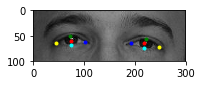

14  1.1 (0, 0)
eyeWH: 210 70
faceWH: 254 254
faceXY: 380 215
eyeXY: 275 145


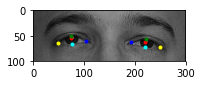

15  1.1 (0, 0)
eyeWH: 192 64
faceWH: 234 234
faceXY: 396 244
eyeXY: 300 180


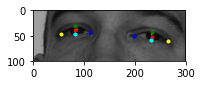

16  1.1 (0, 0)
eyeWH: 210 70
faceWH: 254 254
faceXY: 425 237
eyeXY: 320 167


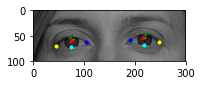

17  1.1 (0, 0)
eyeWH: 207 69
faceWH: 251 251
faceXY: 417 237
eyeXY: 314 168


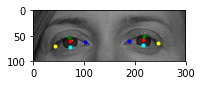

18  1.1 (0, 0)
eyeWH: 411 137
faceWH: 497 497
faceXY: 272 446
eyeXY: 67 309


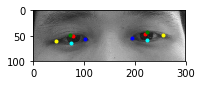

19  1.1 (0, 0)
eyeWH: 399 133
faceWH: 485 485
faceXY: 273 435
eyeXY: 74 302


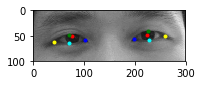

20  1.1 (0, 0)
eyeWH: 405 135
faceWH: 492 492
faceXY: 275 443
eyeXY: 73 308


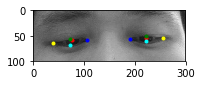

21  1.1 (0, 0)
eyeWH: 414 138
faceWH: 500 500
faceXY: 273 441
eyeXY: 66 303


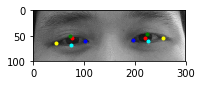

22  1.1 (0, 0)
eyeWH: 411 137
faceWH: 497 497
faceXY: 274 439
eyeXY: 69 302


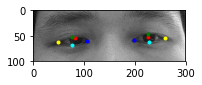

1  1.1 (-5, 5)
eyeWH: 285 95
faceWH: 345 345
faceXY: 402 333
eyeXY: 260 238


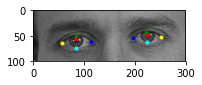

2  1.1 (-5, 5)
eyeWH: 303 101
faceWH: 368 368
faceXY: 353 283
eyeXY: 202 182


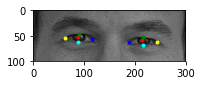

3  1.1 (-5, 5)
eyeWH: 228 76
faceWH: 278 278
faceXY: 346 282
eyeXY: 232 206


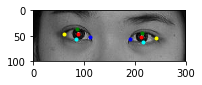

4  1.1 (-5, 5)
eyeWH: 234 78
faceWH: 282 282
faceXY: 347 292
eyeXY: 230 214


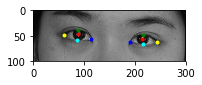

5  1.1 (-5, 5)
eyeWH: 327 109
faceWH: 395 395
faceXY: 371 280
eyeXY: 208 171


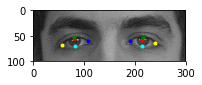

6  1.1 (-5, 5)
eyeWH: 252 84
faceWH: 304 304
faceXY: 389 325
eyeXY: 263 241


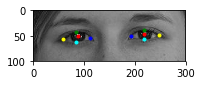

7  1.1 (-5, 5)
eyeWH: 255 85
faceWH: 310 310
faceXY: 409 320
eyeXY: 282 235


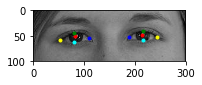

8  1.1 (-5, 5)
eyeWH: 204 68
faceWH: 248 248
faceXY: 395 282
eyeXY: 293 214


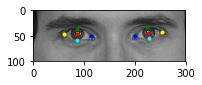

9  1.1 (-5, 5)
eyeWH: 195 65
faceWH: 235 235
faceXY: 384 277
eyeXY: 287 212


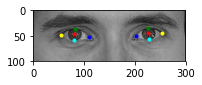

10  1.1 (-5, 5)
eyeWH: 216 72
faceWH: 263 263
faceXY: 412 247
eyeXY: 304 175


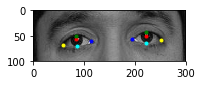

11  1.1 (-5, 5)
eyeWH: 216 72
faceWH: 263 263
faceXY: 416 250
eyeXY: 308 178


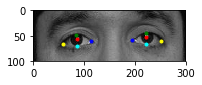

12  1.1 (-5, 5)
eyeWH: 228 76
faceWH: 277 277
faceXY: 364 227
eyeXY: 250 151


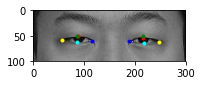

13  1.1 (-5, 5)
eyeWH: 213 71
faceWH: 258 258
faceXY: 387 219
eyeXY: 281 148


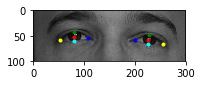

14  1.1 (-5, 5)
eyeWH: 210 70
faceWH: 254 254
faceXY: 375 220
eyeXY: 270 150


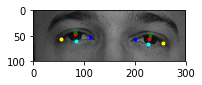

15  1.1 (-5, 5)
eyeWH: 192 64
faceWH: 234 234
faceXY: 391 249
eyeXY: 295 185


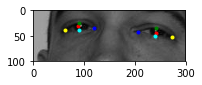

16  1.1 (-5, 5)
eyeWH: 210 70
faceWH: 254 254
faceXY: 420 242
eyeXY: 315 172


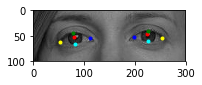

17  1.1 (-5, 5)
eyeWH: 207 69
faceWH: 251 251
faceXY: 412 242
eyeXY: 309 173


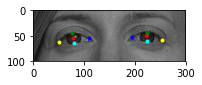

18  1.1 (-5, 5)
eyeWH: 411 137
faceWH: 497 497
faceXY: 267 451
eyeXY: 62 314


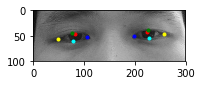

19  1.1 (-5, 5)
eyeWH: 399 133
faceWH: 485 485
faceXY: 268 440
eyeXY: 69 307


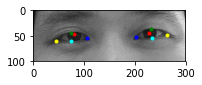

20  1.1 (-5, 5)
eyeWH: 405 135
faceWH: 492 492
faceXY: 270 448
eyeXY: 68 313


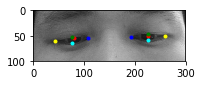

21  1.1 (-5, 5)
eyeWH: 414 138
faceWH: 500 500
faceXY: 268 446
eyeXY: 61 308


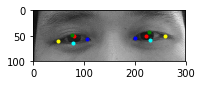

22  1.1 (-5, 5)
eyeWH: 411 137
faceWH: 497 497
faceXY: 269 444
eyeXY: 64 307


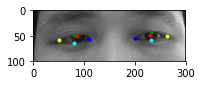

1  1.1 (5, 5)
eyeWH: 285 95
faceWH: 345 345
faceXY: 412 333
eyeXY: 270 238


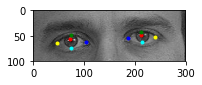

2  1.1 (5, 5)
eyeWH: 303 101
faceWH: 368 368
faceXY: 363 283
eyeXY: 212 182


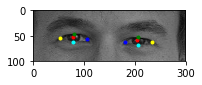

3  1.1 (5, 5)
eyeWH: 228 76
faceWH: 278 278
faceXY: 356 282
eyeXY: 242 206


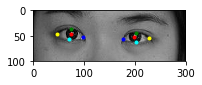

4  1.1 (5, 5)
eyeWH: 234 78
faceWH: 282 282
faceXY: 357 292
eyeXY: 240 214


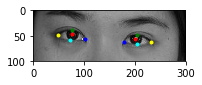

5  1.1 (5, 5)
eyeWH: 327 109
faceWH: 395 395
faceXY: 381 280
eyeXY: 218 171


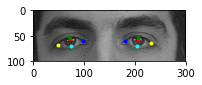

6  1.1 (5, 5)
eyeWH: 252 84
faceWH: 304 304
faceXY: 399 325
eyeXY: 273 241


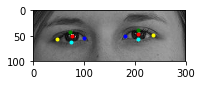

7  1.1 (5, 5)
eyeWH: 255 85
faceWH: 310 310
faceXY: 419 320
eyeXY: 292 235


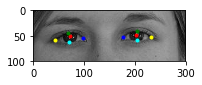

8  1.1 (5, 5)
eyeWH: 204 68
faceWH: 248 248
faceXY: 405 282
eyeXY: 303 214


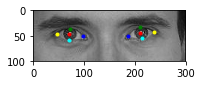

9  1.1 (5, 5)
eyeWH: 195 65
faceWH: 235 235
faceXY: 394 277
eyeXY: 297 212


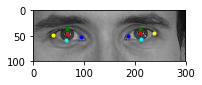

10  1.1 (5, 5)
eyeWH: 216 72
faceWH: 263 263
faceXY: 422 247
eyeXY: 314 175


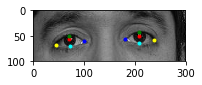

11  1.1 (5, 5)
eyeWH: 216 72
faceWH: 263 263
faceXY: 426 250
eyeXY: 318 178


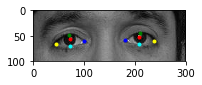

12  1.1 (5, 5)
eyeWH: 228 76
faceWH: 277 277
faceXY: 374 227
eyeXY: 260 151


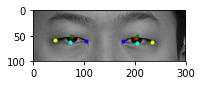

13  1.1 (5, 5)
eyeWH: 213 71
faceWH: 258 258
faceXY: 397 219
eyeXY: 291 148


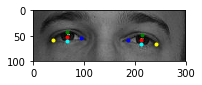

14  1.1 (5, 5)
eyeWH: 210 70
faceWH: 254 254
faceXY: 385 220
eyeXY: 280 150


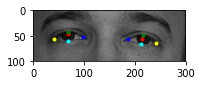

15  1.1 (5, 5)
eyeWH: 192 64
faceWH: 234 234
faceXY: 401 249
eyeXY: 305 185


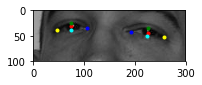

16  1.1 (5, 5)
eyeWH: 210 70
faceWH: 254 254
faceXY: 430 242
eyeXY: 325 172


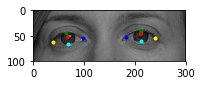

17  1.1 (5, 5)
eyeWH: 207 69
faceWH: 251 251
faceXY: 422 242
eyeXY: 319 173


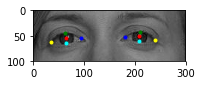

18  1.1 (5, 5)
eyeWH: 411 137
faceWH: 497 497
faceXY: 277 451
eyeXY: 72 314


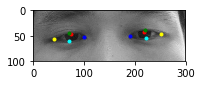

19  1.1 (5, 5)
eyeWH: 399 133
faceWH: 485 485
faceXY: 278 440
eyeXY: 79 307


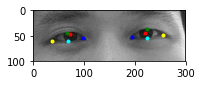

20  1.1 (5, 5)
eyeWH: 405 135
faceWH: 492 492
faceXY: 280 448
eyeXY: 78 313


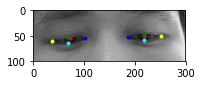

21  1.1 (5, 5)
eyeWH: 414 138
faceWH: 500 500
faceXY: 278 446
eyeXY: 71 308


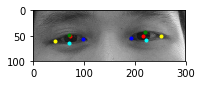

22  1.1 (5, 5)
eyeWH: 411 137
faceWH: 497 497
faceXY: 279 444
eyeXY: 74 307


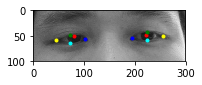

1 _r 0.9 (-5, -5)
eyeWH: 234 78
faceWH: 347 347
faceXY: 397 324
eyeXY: 280 246


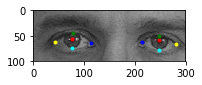

2 _r 0.9 (-5, -5)
eyeWH: 243 81
faceWH: 359 359
faceXY: 354 274
eyeXY: 233 193


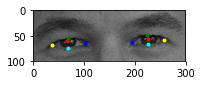

3 _r 0.9 (-5, -5)
eyeWH: 183 61
faceWH: 271 271
faceXY: 343 274
eyeXY: 252 213


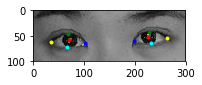

4 _r 0.9 (-5, -5)
eyeWH: 192 64
faceWH: 283 283
faceXY: 347 287
eyeXY: 251 223


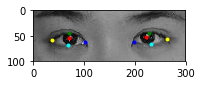

5 _r 0.9 (-5, -5)
eyeWH: 264 88
faceWH: 392 392
faceXY: 365 267
eyeXY: 233 179


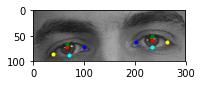

6 _r 0.9 (-5, -5)
eyeWH: 210 70
faceWH: 311 311
faceXY: 390 311
eyeXY: 285 241


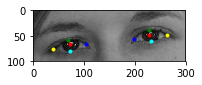

7 _r 0.9 (-5, -5)
eyeWH: 207 69
faceWH: 307 307
faceXY: 409 308
eyeXY: 306 239


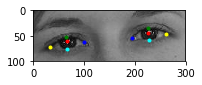

8 _r 0.9 (-5, -5)
eyeWH: 177 59
faceWH: 261 261
faceXY: 392 269
eyeXY: 304 210


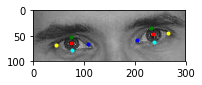

9 _r 0.9 (-5, -5)
eyeWH: 174 58
faceWH: 258 258
faceXY: 380 267
eyeXY: 293 209


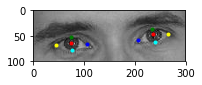

10 _r 0.9 (-5, -5)
eyeWH: 177 59
faceWH: 264 264
faceXY: 406 235
eyeXY: 318 176


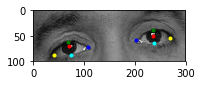

11 _r 0.9 (-5, -5)
eyeWH: 180 60
faceWH: 266 266
faceXY: 408 236
eyeXY: 318 176


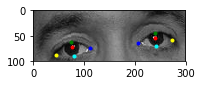

12 _r 0.9 (-5, -5)
eyeWH: 198 66
faceWH: 293 293
faceXY: 355 219
eyeXY: 256 153


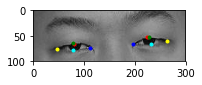

13 _r 0.9 (-5, -5)
eyeWH: 171 57
faceWH: 252 252
faceXY: 380 209
eyeXY: 295 152


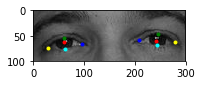

14 _r 0.9 (-5, -5)
eyeWH: 168 56
faceWH: 251 251
faceXY: 370 211
eyeXY: 286 155


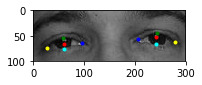

15 _r 0.9 (-5, -5)
eyeWH: 150 50
faceWH: 224 224
faceXY: 386 228
eyeXY: 311 178


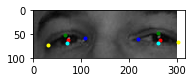

16 _r 0.9 (-5, -5)
eyeWH: 168 56
faceWH: 250 250
faceXY: 425 233
eyeXY: 341 177


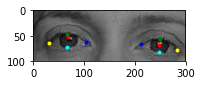

17 _r 0.9 (-5, -5)
eyeWH: 171 57
faceWH: 252 252
faceXY: 415 234
eyeXY: 330 177


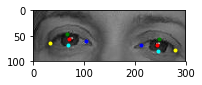

18 _r 0.9 (-5, -5)
eyeWH: 327 109
faceWH: 483 483
faceXY: 265 432
eyeXY: 102 323


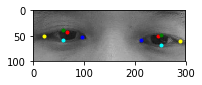

19 _r 0.9 (-5, -5)
eyeWH: 327 109
faceWH: 485 485
faceXY: 269 428
eyeXY: 106 319


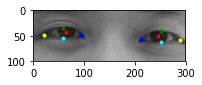

20 _r 0.9 (-5, -5)
eyeWH: 342 114
faceWH: 506 506
faceXY: 268 432
eyeXY: 97 318


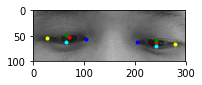

21 _r 0.9 (-5, -5)
eyeWH: 330 110
faceWH: 488 488
faceXY: 263 434
eyeXY: 98 324


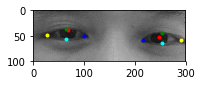

22 _r 0.9 (-5, -5)
eyeWH: 324 108
faceWH: 481 481
faceXY: 269 428
eyeXY: 107 320


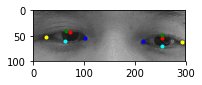

1 _r 0.9 (5, -5)
eyeWH: 234 78
faceWH: 347 347
faceXY: 407 324
eyeXY: 290 246


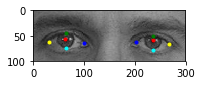

2 _r 0.9 (5, -5)
eyeWH: 243 81
faceWH: 359 359
faceXY: 364 274
eyeXY: 243 193


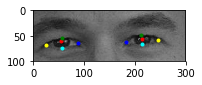

3 _r 0.9 (5, -5)
eyeWH: 183 61
faceWH: 271 271
faceXY: 353 274
eyeXY: 262 213


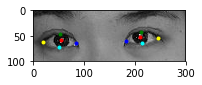

4 _r 0.9 (5, -5)
eyeWH: 192 64
faceWH: 283 283
faceXY: 357 287
eyeXY: 261 223


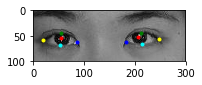

5 _r 0.9 (5, -5)
eyeWH: 264 88
faceWH: 392 392
faceXY: 375 267
eyeXY: 243 179


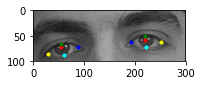

6 _r 0.9 (5, -5)
eyeWH: 210 70
faceWH: 311 311
faceXY: 400 311
eyeXY: 295 241


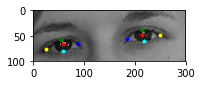

7 _r 0.9 (5, -5)
eyeWH: 207 69
faceWH: 307 307
faceXY: 419 308
eyeXY: 316 239


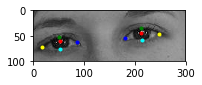

8 _r 0.9 (5, -5)
eyeWH: 177 59
faceWH: 261 261
faceXY: 402 269
eyeXY: 314 210


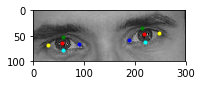

9 _r 0.9 (5, -5)
eyeWH: 174 58
faceWH: 258 258
faceXY: 390 267
eyeXY: 303 209


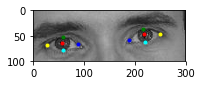

10 _r 0.9 (5, -5)
eyeWH: 177 59
faceWH: 264 264
faceXY: 416 235
eyeXY: 328 176


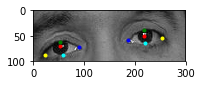

11 _r 0.9 (5, -5)
eyeWH: 180 60
faceWH: 266 266
faceXY: 418 236
eyeXY: 328 176


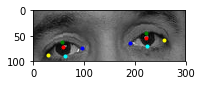

12 _r 0.9 (5, -5)
eyeWH: 198 66
faceWH: 293 293
faceXY: 365 219
eyeXY: 266 153


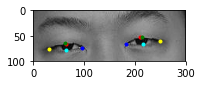

13 _r 0.9 (5, -5)
eyeWH: 171 57
faceWH: 252 252
faceXY: 390 209
eyeXY: 305 152


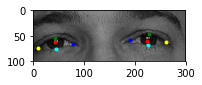

14 _r 0.9 (5, -5)
eyeWH: 168 56
faceWH: 251 251
faceXY: 380 211
eyeXY: 296 155


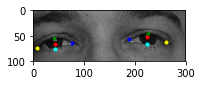

15 _r 0.9 (5, -5)
eyeWH: 150 50
faceWH: 224 224
faceXY: 396 228
eyeXY: 321 178


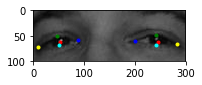

16 _r 0.9 (5, -5)
eyeWH: 168 56
faceWH: 250 250
faceXY: 435 233
eyeXY: 351 177


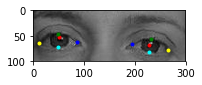

17 _r 0.9 (5, -5)
eyeWH: 171 57
faceWH: 252 252
faceXY: 425 234
eyeXY: 340 177


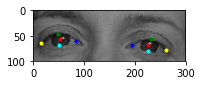

18 _r 0.9 (5, -5)
eyeWH: 327 109
faceWH: 483 483
faceXY: 275 432
eyeXY: 112 323


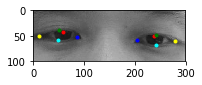

19 _r 0.9 (5, -5)
eyeWH: 327 109
faceWH: 485 485
faceXY: 279 428
eyeXY: 116 319


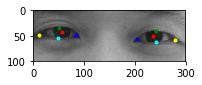

20 _r 0.9 (5, -5)
eyeWH: 342 114
faceWH: 506 506
faceXY: 278 432
eyeXY: 107 318


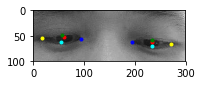

21 _r 0.9 (5, -5)
eyeWH: 330 110
faceWH: 488 488
faceXY: 273 434
eyeXY: 108 324


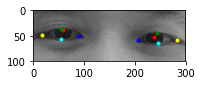

22 _r 0.9 (5, -5)
eyeWH: 324 108
faceWH: 481 481
faceXY: 279 428
eyeXY: 117 320


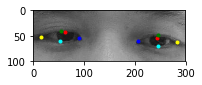

1 _r 0.9 (0, 0)
eyeWH: 234 78
faceWH: 347 347
faceXY: 402 329
eyeXY: 285 251


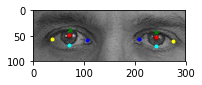

2 _r 0.9 (0, 0)
eyeWH: 243 81
faceWH: 359 359
faceXY: 359 279
eyeXY: 238 198


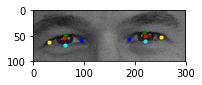

3 _r 0.9 (0, 0)
eyeWH: 183 61
faceWH: 271 271
faceXY: 348 279
eyeXY: 257 218


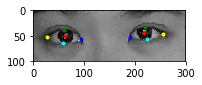

4 _r 0.9 (0, 0)
eyeWH: 192 64
faceWH: 283 283
faceXY: 352 292
eyeXY: 256 228


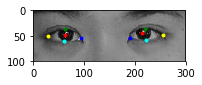

5 _r 0.9 (0, 0)
eyeWH: 264 88
faceWH: 392 392
faceXY: 370 272
eyeXY: 238 184


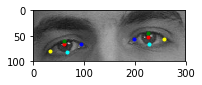

6 _r 0.9 (0, 0)
eyeWH: 210 70
faceWH: 311 311
faceXY: 395 316
eyeXY: 290 246


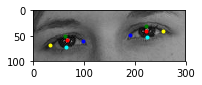

7 _r 0.9 (0, 0)
eyeWH: 207 69
faceWH: 307 307
faceXY: 414 313
eyeXY: 311 244


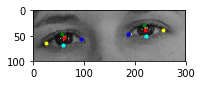

8 _r 0.9 (0, 0)
eyeWH: 177 59
faceWH: 261 261
faceXY: 397 274
eyeXY: 309 215


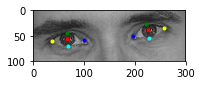

9 _r 0.9 (0, 0)
eyeWH: 174 58
faceWH: 258 258
faceXY: 385 272
eyeXY: 298 214


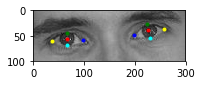

10 _r 0.9 (0, 0)
eyeWH: 177 59
faceWH: 264 264
faceXY: 411 240
eyeXY: 323 181


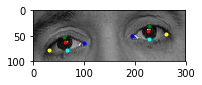

11 _r 0.9 (0, 0)
eyeWH: 180 60
faceWH: 266 266
faceXY: 413 241
eyeXY: 323 181


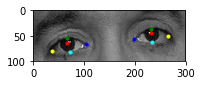

12 _r 0.9 (0, 0)
eyeWH: 198 66
faceWH: 293 293
faceXY: 360 224
eyeXY: 261 158


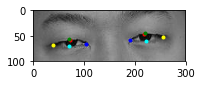

13 _r 0.9 (0, 0)
eyeWH: 171 57
faceWH: 252 252
faceXY: 385 214
eyeXY: 300 157


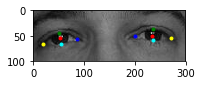

14 _r 0.9 (0, 0)
eyeWH: 168 56
faceWH: 251 251
faceXY: 375 216
eyeXY: 291 160


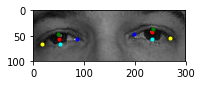

15 _r 0.9 (0, 0)
eyeWH: 150 50
faceWH: 224 224
faceXY: 391 233
eyeXY: 316 183


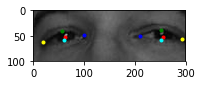

16 _r 0.9 (0, 0)
eyeWH: 168 56
faceWH: 250 250
faceXY: 430 238
eyeXY: 346 182


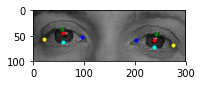

17 _r 0.9 (0, 0)
eyeWH: 171 57
faceWH: 252 252
faceXY: 420 239
eyeXY: 335 182


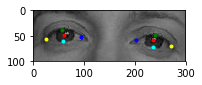

18 _r 0.9 (0, 0)
eyeWH: 327 109
faceWH: 483 483
faceXY: 270 437
eyeXY: 107 328


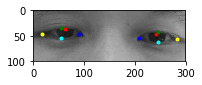

19 _r 0.9 (0, 0)
eyeWH: 327 109
faceWH: 485 485
faceXY: 274 433
eyeXY: 111 324


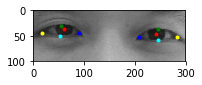

20 _r 0.9 (0, 0)
eyeWH: 342 114
faceWH: 506 506
faceXY: 273 437
eyeXY: 102 323


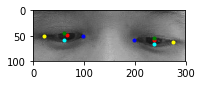

21 _r 0.9 (0, 0)
eyeWH: 330 110
faceWH: 488 488
faceXY: 268 439
eyeXY: 103 329


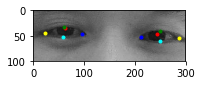

22 _r 0.9 (0, 0)
eyeWH: 324 108
faceWH: 481 481
faceXY: 274 433
eyeXY: 112 325


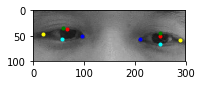

1 _r 0.9 (-5, 5)
eyeWH: 234 78
faceWH: 347 347
faceXY: 397 334
eyeXY: 280 256


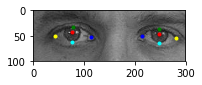

2 _r 0.9 (-5, 5)
eyeWH: 243 81
faceWH: 359 359
faceXY: 354 284
eyeXY: 233 203


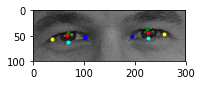

3 _r 0.9 (-5, 5)
eyeWH: 183 61
faceWH: 271 271
faceXY: 343 284
eyeXY: 252 223


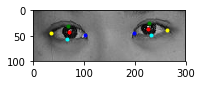

4 _r 0.9 (-5, 5)
eyeWH: 192 64
faceWH: 283 283
faceXY: 347 297
eyeXY: 251 233


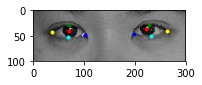

5 _r 0.9 (-5, 5)
eyeWH: 264 88
faceWH: 392 392
faceXY: 365 277
eyeXY: 233 189


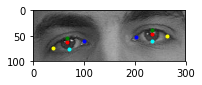

6 _r 0.9 (-5, 5)
eyeWH: 210 70
faceWH: 311 311
faceXY: 390 321
eyeXY: 285 251


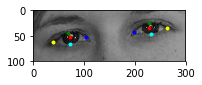

7 _r 0.9 (-5, 5)
eyeWH: 207 69
faceWH: 307 307
faceXY: 409 318
eyeXY: 306 249


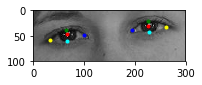

8 _r 0.9 (-5, 5)
eyeWH: 177 59
faceWH: 261 261
faceXY: 392 279
eyeXY: 304 220


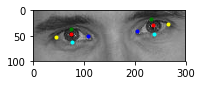

9 _r 0.9 (-5, 5)
eyeWH: 174 58
faceWH: 258 258
faceXY: 380 277
eyeXY: 293 219


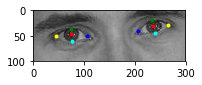

10 _r 0.9 (-5, 5)
eyeWH: 177 59
faceWH: 264 264
faceXY: 406 245
eyeXY: 318 186


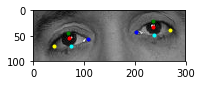

11 _r 0.9 (-5, 5)
eyeWH: 180 60
faceWH: 266 266
faceXY: 408 246
eyeXY: 318 186


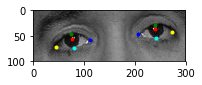

12 _r 0.9 (-5, 5)
eyeWH: 198 66
faceWH: 293 293
faceXY: 355 229
eyeXY: 256 163


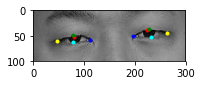

13 _r 0.9 (-5, 5)
eyeWH: 171 57
faceWH: 252 252
faceXY: 380 219
eyeXY: 295 162


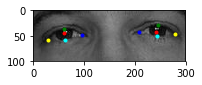

14 _r 0.9 (-5, 5)
eyeWH: 168 56
faceWH: 251 251
faceXY: 370 221
eyeXY: 286 165


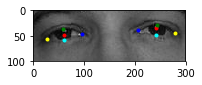

15 _r 0.9 (-5, 5)
eyeWH: 150 50
faceWH: 224 224
faceXY: 386 238
eyeXY: 311 188


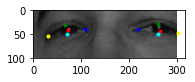

16 _r 0.9 (-5, 5)
eyeWH: 168 56
faceWH: 250 250
faceXY: 425 243
eyeXY: 341 187


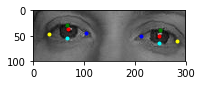

17 _r 0.9 (-5, 5)
eyeWH: 171 57
faceWH: 252 252
faceXY: 415 244
eyeXY: 330 187


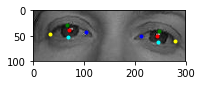

18 _r 0.9 (-5, 5)
eyeWH: 327 109
faceWH: 483 483
faceXY: 265 442
eyeXY: 102 333


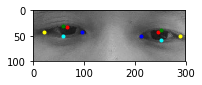

19 _r 0.9 (-5, 5)
eyeWH: 327 109
faceWH: 485 485
faceXY: 269 438
eyeXY: 106 329


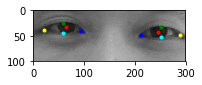

20 _r 0.9 (-5, 5)
eyeWH: 342 114
faceWH: 506 506
faceXY: 268 442
eyeXY: 97 328


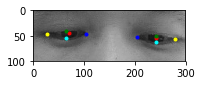

21 _r 0.9 (-5, 5)
eyeWH: 330 110
faceWH: 488 488
faceXY: 263 444
eyeXY: 98 334


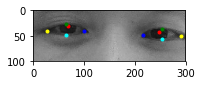

22 _r 0.9 (-5, 5)
eyeWH: 324 108
faceWH: 481 481
faceXY: 269 438
eyeXY: 107 330


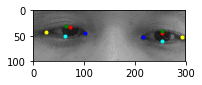

1 _r 0.9 (5, 5)
eyeWH: 234 78
faceWH: 347 347
faceXY: 407 334
eyeXY: 290 256


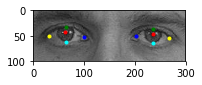

2 _r 0.9 (5, 5)
eyeWH: 243 81
faceWH: 359 359
faceXY: 364 284
eyeXY: 243 203


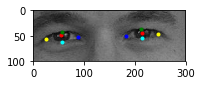

3 _r 0.9 (5, 5)
eyeWH: 183 61
faceWH: 271 271
faceXY: 353 284
eyeXY: 262 223


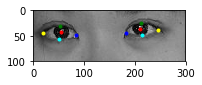

4 _r 0.9 (5, 5)
eyeWH: 192 64
faceWH: 283 283
faceXY: 357 297
eyeXY: 261 233


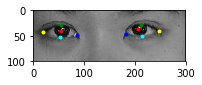

5 _r 0.9 (5, 5)
eyeWH: 264 88
faceWH: 392 392
faceXY: 375 277
eyeXY: 243 189


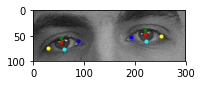

6 _r 0.9 (5, 5)
eyeWH: 210 70
faceWH: 311 311
faceXY: 400 321
eyeXY: 295 251


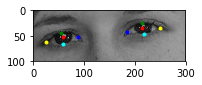

7 _r 0.9 (5, 5)
eyeWH: 207 69
faceWH: 307 307
faceXY: 419 318
eyeXY: 316 249


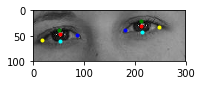

8 _r 0.9 (5, 5)
eyeWH: 177 59
faceWH: 261 261
faceXY: 402 279
eyeXY: 314 220


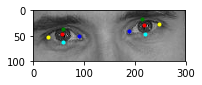

9 _r 0.9 (5, 5)
eyeWH: 174 58
faceWH: 258 258
faceXY: 390 277
eyeXY: 303 219


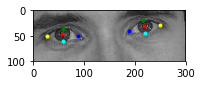

10 _r 0.9 (5, 5)
eyeWH: 177 59
faceWH: 264 264
faceXY: 416 245
eyeXY: 328 186


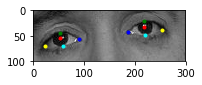

11 _r 0.9 (5, 5)
eyeWH: 180 60
faceWH: 266 266
faceXY: 418 246
eyeXY: 328 186


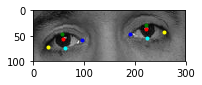

12 _r 0.9 (5, 5)
eyeWH: 198 66
faceWH: 293 293
faceXY: 365 229
eyeXY: 266 163


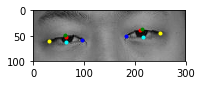

13 _r 0.9 (5, 5)
eyeWH: 171 57
faceWH: 252 252
faceXY: 390 219
eyeXY: 305 162


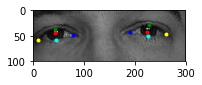

14 _r 0.9 (5, 5)
eyeWH: 168 56
faceWH: 251 251
faceXY: 380 221
eyeXY: 296 165


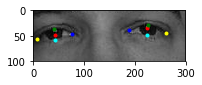

15 _r 0.9 (5, 5)
eyeWH: 150 50
faceWH: 224 224
faceXY: 396 238
eyeXY: 321 188


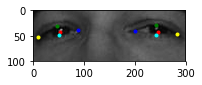

16 _r 0.9 (5, 5)
eyeWH: 168 56
faceWH: 250 250
faceXY: 435 243
eyeXY: 351 187


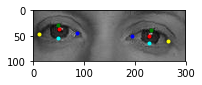

17 _r 0.9 (5, 5)
eyeWH: 171 57
faceWH: 252 252
faceXY: 425 244
eyeXY: 340 187


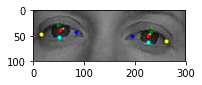

18 _r 0.9 (5, 5)
eyeWH: 327 109
faceWH: 483 483
faceXY: 275 442
eyeXY: 112 333


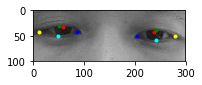

19 _r 0.9 (5, 5)
eyeWH: 327 109
faceWH: 485 485
faceXY: 279 438
eyeXY: 116 329


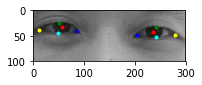

20 _r 0.9 (5, 5)
eyeWH: 342 114
faceWH: 506 506
faceXY: 278 442
eyeXY: 107 328


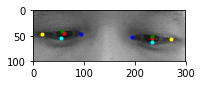

21 _r 0.9 (5, 5)
eyeWH: 330 110
faceWH: 488 488
faceXY: 273 444
eyeXY: 108 334


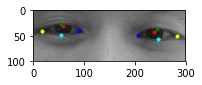

22 _r 0.9 (5, 5)
eyeWH: 324 108
faceWH: 481 481
faceXY: 279 438
eyeXY: 117 330


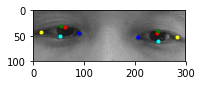

1 _r 1.0 (-5, -5)
eyeWH: 261 87
faceWH: 347 347
faceXY: 397 324
eyeXY: 267 237


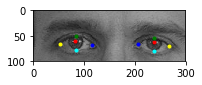

2 _r 1.0 (-5, -5)
eyeWH: 270 90
faceWH: 359 359
faceXY: 354 274
eyeXY: 219 184


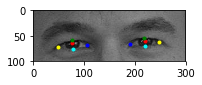

3 _r 1.0 (-5, -5)
eyeWH: 204 68
faceWH: 271 271
faceXY: 343 274
eyeXY: 241 206


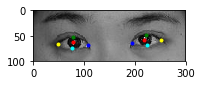

4 _r 1.0 (-5, -5)
eyeWH: 213 71
faceWH: 283 283
faceXY: 347 287
eyeXY: 241 216


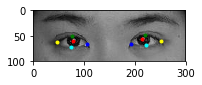

5 _r 1.0 (-5, -5)
eyeWH: 294 98
faceWH: 392 392
faceXY: 365 267
eyeXY: 218 169


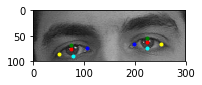

6 _r 1.0 (-5, -5)
eyeWH: 234 78
faceWH: 311 311
faceXY: 390 311
eyeXY: 273 233


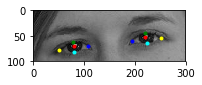

7 _r 1.0 (-5, -5)
eyeWH: 231 77
faceWH: 307 307
faceXY: 409 308
eyeXY: 294 231


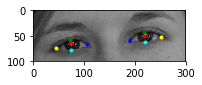

8 _r 1.0 (-5, -5)
eyeWH: 195 65
faceWH: 261 261
faceXY: 392 269
eyeXY: 295 204


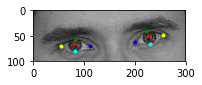

9 _r 1.0 (-5, -5)
eyeWH: 195 65
faceWH: 258 258
faceXY: 380 267
eyeXY: 283 202


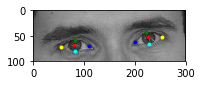

10 _r 1.0 (-5, -5)
eyeWH: 198 66
faceWH: 264 264
faceXY: 406 235
eyeXY: 307 169


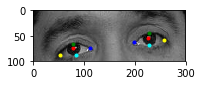

11 _r 1.0 (-5, -5)
eyeWH: 201 67
faceWH: 266 266
faceXY: 408 236
eyeXY: 308 169


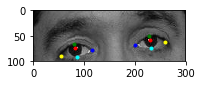

12 _r 1.0 (-5, -5)
eyeWH: 219 73
faceWH: 293 293
faceXY: 355 219
eyeXY: 246 146


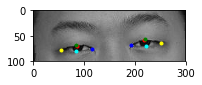

13 _r 1.0 (-5, -5)
eyeWH: 189 63
faceWH: 252 252
faceXY: 380 209
eyeXY: 286 146


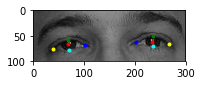

14 _r 1.0 (-5, -5)
eyeWH: 189 63
faceWH: 251 251
faceXY: 370 211
eyeXY: 276 148


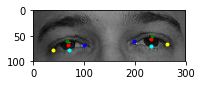

15 _r 1.0 (-5, -5)
eyeWH: 168 56
faceWH: 224 224
faceXY: 386 228
eyeXY: 302 172


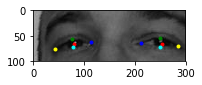

16 _r 1.0 (-5, -5)
eyeWH: 189 63
faceWH: 250 250
faceXY: 425 233
eyeXY: 331 170


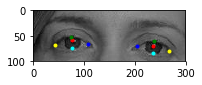

17 _r 1.0 (-5, -5)
eyeWH: 189 63
faceWH: 252 252
faceXY: 415 234
eyeXY: 321 171


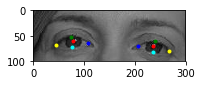

18 _r 1.0 (-5, -5)
eyeWH: 363 121
faceWH: 483 483
faceXY: 265 432
eyeXY: 84 311


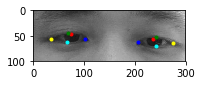

19 _r 1.0 (-5, -5)
eyeWH: 363 121
faceWH: 485 485
faceXY: 269 428
eyeXY: 88 307


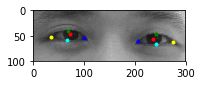

20 _r 1.0 (-5, -5)
eyeWH: 381 127
faceWH: 506 506
faceXY: 268 432
eyeXY: 78 305


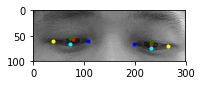

21 _r 1.0 (-5, -5)
eyeWH: 366 122
faceWH: 488 488
faceXY: 263 434
eyeXY: 80 312


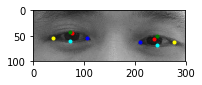

22 _r 1.0 (-5, -5)
eyeWH: 360 120
faceWH: 481 481
faceXY: 269 428
eyeXY: 89 308


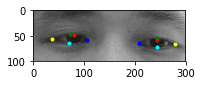

1 _r 1.0 (5, -5)
eyeWH: 261 87
faceWH: 347 347
faceXY: 407 324
eyeXY: 277 237


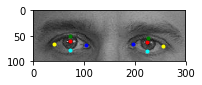

2 _r 1.0 (5, -5)
eyeWH: 270 90
faceWH: 359 359
faceXY: 364 274
eyeXY: 229 184


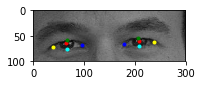

3 _r 1.0 (5, -5)
eyeWH: 204 68
faceWH: 271 271
faceXY: 353 274
eyeXY: 251 206


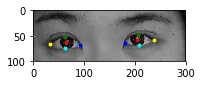

4 _r 1.0 (5, -5)
eyeWH: 213 71
faceWH: 283 283
faceXY: 357 287
eyeXY: 251 216


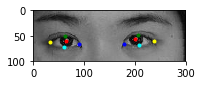

5 _r 1.0 (5, -5)
eyeWH: 294 98
faceWH: 392 392
faceXY: 375 267
eyeXY: 228 169


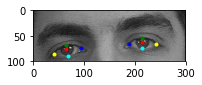

6 _r 1.0 (5, -5)
eyeWH: 234 78
faceWH: 311 311
faceXY: 400 311
eyeXY: 283 233


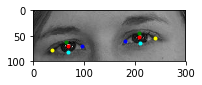

7 _r 1.0 (5, -5)
eyeWH: 231 77
faceWH: 307 307
faceXY: 419 308
eyeXY: 304 231


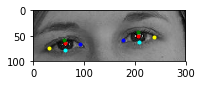

8 _r 1.0 (5, -5)
eyeWH: 195 65
faceWH: 261 261
faceXY: 402 269
eyeXY: 305 204


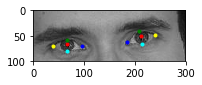

9 _r 1.0 (5, -5)
eyeWH: 195 65
faceWH: 258 258
faceXY: 390 267
eyeXY: 293 202


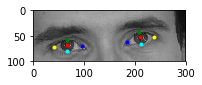

10 _r 1.0 (5, -5)
eyeWH: 198 66
faceWH: 264 264
faceXY: 416 235
eyeXY: 317 169


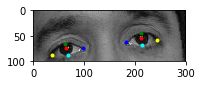

11 _r 1.0 (5, -5)
eyeWH: 201 67
faceWH: 266 266
faceXY: 418 236
eyeXY: 318 169


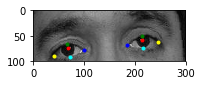

12 _r 1.0 (5, -5)
eyeWH: 219 73
faceWH: 293 293
faceXY: 365 219
eyeXY: 256 146


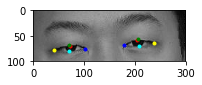

13 _r 1.0 (5, -5)
eyeWH: 189 63
faceWH: 252 252
faceXY: 390 209
eyeXY: 296 146


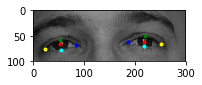

14 _r 1.0 (5, -5)
eyeWH: 189 63
faceWH: 251 251
faceXY: 380 211
eyeXY: 286 148


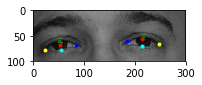

15 _r 1.0 (5, -5)
eyeWH: 168 56
faceWH: 224 224
faceXY: 396 228
eyeXY: 312 172


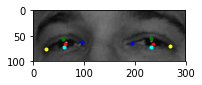

16 _r 1.0 (5, -5)
eyeWH: 189 63
faceWH: 250 250
faceXY: 435 233
eyeXY: 341 170


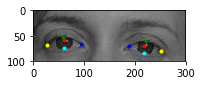

17 _r 1.0 (5, -5)
eyeWH: 189 63
faceWH: 252 252
faceXY: 425 234
eyeXY: 331 171


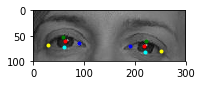

18 _r 1.0 (5, -5)
eyeWH: 363 121
faceWH: 483 483
faceXY: 275 432
eyeXY: 94 311


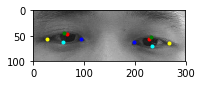

19 _r 1.0 (5, -5)
eyeWH: 363 121
faceWH: 485 485
faceXY: 279 428
eyeXY: 98 307


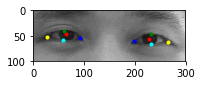

20 _r 1.0 (5, -5)
eyeWH: 381 127
faceWH: 506 506
faceXY: 278 432
eyeXY: 88 305


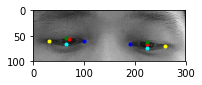

21 _r 1.0 (5, -5)
eyeWH: 366 122
faceWH: 488 488
faceXY: 273 434
eyeXY: 90 312


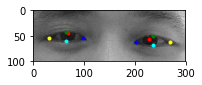

22 _r 1.0 (5, -5)
eyeWH: 360 120
faceWH: 481 481
faceXY: 279 428
eyeXY: 99 308


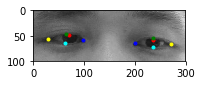

1 _r 1.0 (0, 0)
eyeWH: 261 87
faceWH: 347 347
faceXY: 402 329
eyeXY: 272 242


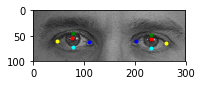

2 _r 1.0 (0, 0)
eyeWH: 270 90
faceWH: 359 359
faceXY: 359 279
eyeXY: 224 189


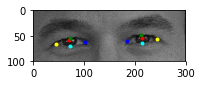

3 _r 1.0 (0, 0)
eyeWH: 204 68
faceWH: 271 271
faceXY: 348 279
eyeXY: 246 211


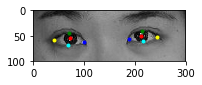

4 _r 1.0 (0, 0)
eyeWH: 213 71
faceWH: 283 283
faceXY: 352 292
eyeXY: 246 221


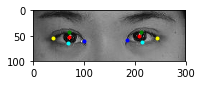

5 _r 1.0 (0, 0)
eyeWH: 294 98
faceWH: 392 392
faceXY: 370 272
eyeXY: 223 174


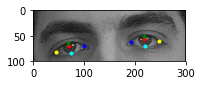

6 _r 1.0 (0, 0)
eyeWH: 234 78
faceWH: 311 311
faceXY: 395 316
eyeXY: 278 238


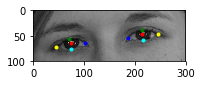

7 _r 1.0 (0, 0)
eyeWH: 231 77
faceWH: 307 307
faceXY: 414 313
eyeXY: 299 236


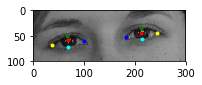

8 _r 1.0 (0, 0)
eyeWH: 195 65
faceWH: 261 261
faceXY: 397 274
eyeXY: 300 209


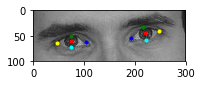

9 _r 1.0 (0, 0)
eyeWH: 195 65
faceWH: 258 258
faceXY: 385 272
eyeXY: 288 207


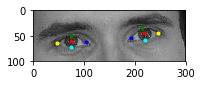

10 _r 1.0 (0, 0)
eyeWH: 198 66
faceWH: 264 264
faceXY: 411 240
eyeXY: 312 174


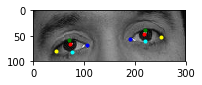

11 _r 1.0 (0, 0)
eyeWH: 201 67
faceWH: 266 266
faceXY: 413 241
eyeXY: 313 174


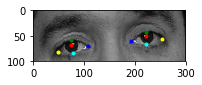

12 _r 1.0 (0, 0)
eyeWH: 219 73
faceWH: 293 293
faceXY: 360 224
eyeXY: 251 151


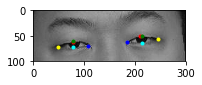

13 _r 1.0 (0, 0)
eyeWH: 189 63
faceWH: 252 252
faceXY: 385 214
eyeXY: 291 151


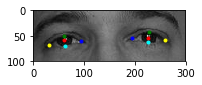

14 _r 1.0 (0, 0)
eyeWH: 189 63
faceWH: 251 251
faceXY: 375 216
eyeXY: 281 153


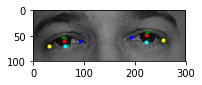

15 _r 1.0 (0, 0)
eyeWH: 168 56
faceWH: 224 224
faceXY: 391 233
eyeXY: 307 177


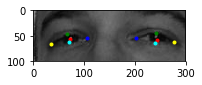

16 _r 1.0 (0, 0)
eyeWH: 189 63
faceWH: 250 250
faceXY: 430 238
eyeXY: 336 175


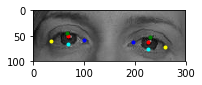

17 _r 1.0 (0, 0)
eyeWH: 189 63
faceWH: 252 252
faceXY: 420 239
eyeXY: 326 176


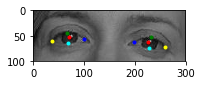

18 _r 1.0 (0, 0)
eyeWH: 363 121
faceWH: 483 483
faceXY: 270 437
eyeXY: 89 316


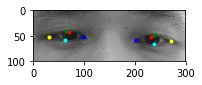

19 _r 1.0 (0, 0)
eyeWH: 363 121
faceWH: 485 485
faceXY: 274 433
eyeXY: 93 312


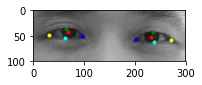

20 _r 1.0 (0, 0)
eyeWH: 381 127
faceWH: 506 506
faceXY: 273 437
eyeXY: 83 310


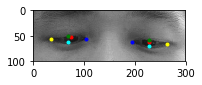

21 _r 1.0 (0, 0)
eyeWH: 366 122
faceWH: 488 488
faceXY: 268 439
eyeXY: 85 317


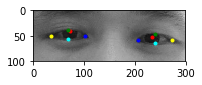

22 _r 1.0 (0, 0)
eyeWH: 360 120
faceWH: 481 481
faceXY: 274 433
eyeXY: 94 313


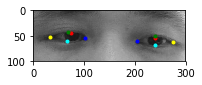

1 _r 1.0 (-5, 5)
eyeWH: 261 87
faceWH: 347 347
faceXY: 397 334
eyeXY: 267 247


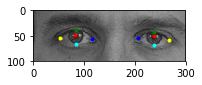

2 _r 1.0 (-5, 5)
eyeWH: 270 90
faceWH: 359 359
faceXY: 354 284
eyeXY: 219 194


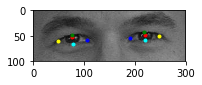

3 _r 1.0 (-5, 5)
eyeWH: 204 68
faceWH: 271 271
faceXY: 343 284
eyeXY: 241 216


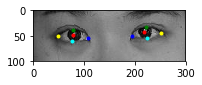

4 _r 1.0 (-5, 5)
eyeWH: 213 71
faceWH: 283 283
faceXY: 347 297
eyeXY: 241 226


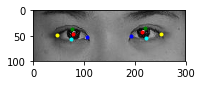

5 _r 1.0 (-5, 5)
eyeWH: 294 98
faceWH: 392 392
faceXY: 365 277
eyeXY: 218 179


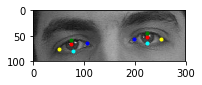

6 _r 1.0 (-5, 5)
eyeWH: 234 78
faceWH: 311 311
faceXY: 390 321
eyeXY: 273 243


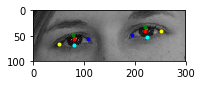

7 _r 1.0 (-5, 5)
eyeWH: 231 77
faceWH: 307 307
faceXY: 409 318
eyeXY: 294 241


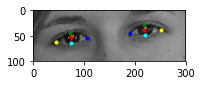

8 _r 1.0 (-5, 5)
eyeWH: 195 65
faceWH: 261 261
faceXY: 392 279
eyeXY: 295 214


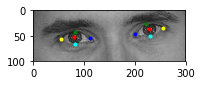

9 _r 1.0 (-5, 5)
eyeWH: 195 65
faceWH: 258 258
faceXY: 380 277
eyeXY: 283 212


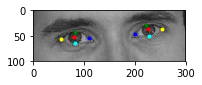

10 _r 1.0 (-5, 5)
eyeWH: 198 66
faceWH: 264 264
faceXY: 406 245
eyeXY: 307 179


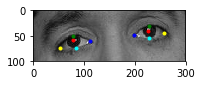

11 _r 1.0 (-5, 5)
eyeWH: 201 67
faceWH: 266 266
faceXY: 408 246
eyeXY: 308 179


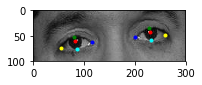

12 _r 1.0 (-5, 5)
eyeWH: 219 73
faceWH: 293 293
faceXY: 355 229
eyeXY: 246 156


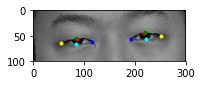

13 _r 1.0 (-5, 5)
eyeWH: 189 63
faceWH: 252 252
faceXY: 380 219
eyeXY: 286 156


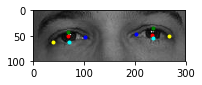

14 _r 1.0 (-5, 5)
eyeWH: 189 63
faceWH: 251 251
faceXY: 370 221
eyeXY: 276 158


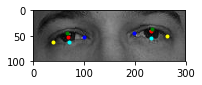

15 _r 1.0 (-5, 5)
eyeWH: 168 56
faceWH: 224 224
faceXY: 386 238
eyeXY: 302 182


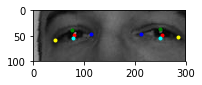

16 _r 1.0 (-5, 5)
eyeWH: 189 63
faceWH: 250 250
faceXY: 425 243
eyeXY: 331 180


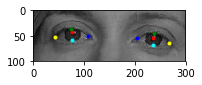

17 _r 1.0 (-5, 5)
eyeWH: 189 63
faceWH: 252 252
faceXY: 415 244
eyeXY: 321 181


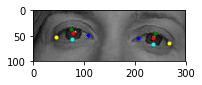

18 _r 1.0 (-5, 5)
eyeWH: 363 121
faceWH: 483 483
faceXY: 265 442
eyeXY: 84 321


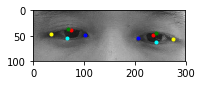

19 _r 1.0 (-5, 5)
eyeWH: 363 121
faceWH: 485 485
faceXY: 269 438
eyeXY: 88 317


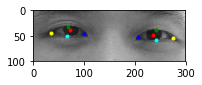

20 _r 1.0 (-5, 5)
eyeWH: 381 127
faceWH: 506 506
faceXY: 268 442
eyeXY: 78 315


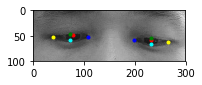

21 _r 1.0 (-5, 5)
eyeWH: 366 122
faceWH: 488 488
faceXY: 263 444
eyeXY: 80 322


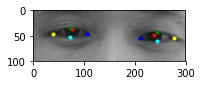

22 _r 1.0 (-5, 5)
eyeWH: 360 120
faceWH: 481 481
faceXY: 269 438
eyeXY: 89 318


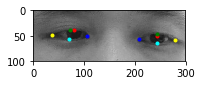

1 _r 1.0 (5, 5)
eyeWH: 261 87
faceWH: 347 347
faceXY: 407 334
eyeXY: 277 247


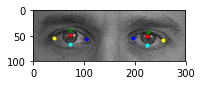

2 _r 1.0 (5, 5)
eyeWH: 270 90
faceWH: 359 359
faceXY: 364 284
eyeXY: 229 194


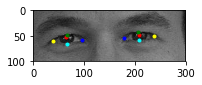

3 _r 1.0 (5, 5)
eyeWH: 204 68
faceWH: 271 271
faceXY: 353 284
eyeXY: 251 216


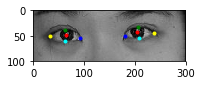

4 _r 1.0 (5, 5)
eyeWH: 213 71
faceWH: 283 283
faceXY: 357 297
eyeXY: 251 226


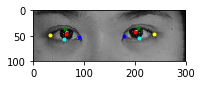

5 _r 1.0 (5, 5)
eyeWH: 294 98
faceWH: 392 392
faceXY: 375 277
eyeXY: 228 179


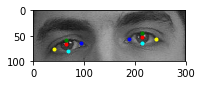

6 _r 1.0 (5, 5)
eyeWH: 234 78
faceWH: 311 311
faceXY: 400 321
eyeXY: 283 243


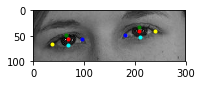

7 _r 1.0 (5, 5)
eyeWH: 231 77
faceWH: 307 307
faceXY: 419 318
eyeXY: 304 241


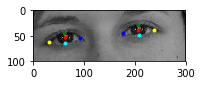

8 _r 1.0 (5, 5)
eyeWH: 195 65
faceWH: 261 261
faceXY: 402 279
eyeXY: 305 214


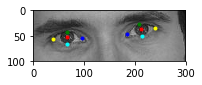

9 _r 1.0 (5, 5)
eyeWH: 195 65
faceWH: 258 258
faceXY: 390 277
eyeXY: 293 212


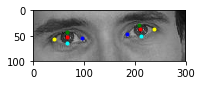

10 _r 1.0 (5, 5)
eyeWH: 198 66
faceWH: 264 264
faceXY: 416 245
eyeXY: 317 179


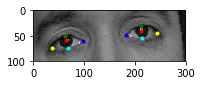

11 _r 1.0 (5, 5)
eyeWH: 201 67
faceWH: 266 266
faceXY: 418 246
eyeXY: 318 179


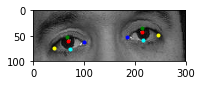

12 _r 1.0 (5, 5)
eyeWH: 219 73
faceWH: 293 293
faceXY: 365 229
eyeXY: 256 156


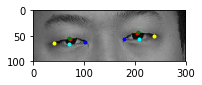

13 _r 1.0 (5, 5)
eyeWH: 189 63
faceWH: 252 252
faceXY: 390 219
eyeXY: 296 156


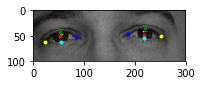

14 _r 1.0 (5, 5)
eyeWH: 189 63
faceWH: 251 251
faceXY: 380 221
eyeXY: 286 158


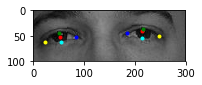

15 _r 1.0 (5, 5)
eyeWH: 168 56
faceWH: 224 224
faceXY: 396 238
eyeXY: 312 182


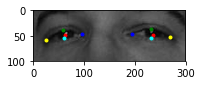

16 _r 1.0 (5, 5)
eyeWH: 189 63
faceWH: 250 250
faceXY: 435 243
eyeXY: 341 180


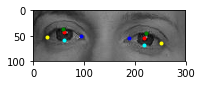

17 _r 1.0 (5, 5)
eyeWH: 189 63
faceWH: 252 252
faceXY: 425 244
eyeXY: 331 181


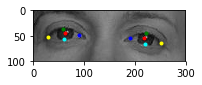

18 _r 1.0 (5, 5)
eyeWH: 363 121
faceWH: 483 483
faceXY: 275 442
eyeXY: 94 321


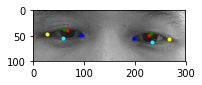

19 _r 1.0 (5, 5)
eyeWH: 363 121
faceWH: 485 485
faceXY: 279 438
eyeXY: 98 317


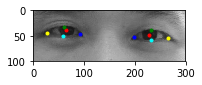

20 _r 1.0 (5, 5)
eyeWH: 381 127
faceWH: 506 506
faceXY: 278 442
eyeXY: 88 315


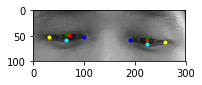

21 _r 1.0 (5, 5)
eyeWH: 366 122
faceWH: 488 488
faceXY: 273 444
eyeXY: 90 322


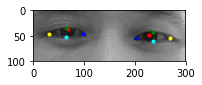

22 _r 1.0 (5, 5)
eyeWH: 360 120
faceWH: 481 481
faceXY: 279 438
eyeXY: 99 318


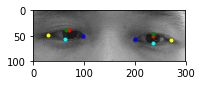

1 _r 1.1 (-5, -5)
eyeWH: 285 95
faceWH: 347 347
faceXY: 397 324
eyeXY: 255 229


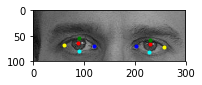

2 _r 1.1 (-5, -5)
eyeWH: 297 99
faceWH: 359 359
faceXY: 354 274
eyeXY: 206 175


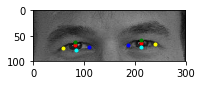

3 _r 1.1 (-5, -5)
eyeWH: 225 75
faceWH: 271 271
faceXY: 343 274
eyeXY: 231 199


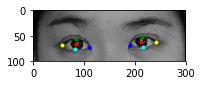

4 _r 1.1 (-5, -5)
eyeWH: 234 78
faceWH: 283 283
faceXY: 347 287
eyeXY: 230 209


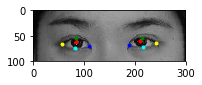

5 _r 1.1 (-5, -5)
eyeWH: 324 108
faceWH: 392 392
faceXY: 365 267
eyeXY: 203 159


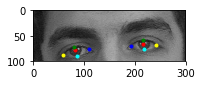

6 _r 1.1 (-5, -5)
eyeWH: 258 86
faceWH: 311 311
faceXY: 390 311
eyeXY: 261 225


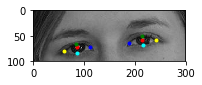

7 _r 1.1 (-5, -5)
eyeWH: 252 84
faceWH: 307 307
faceXY: 409 308
eyeXY: 283 224


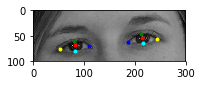

8 _r 1.1 (-5, -5)
eyeWH: 216 72
faceWH: 261 261
faceXY: 392 269
eyeXY: 284 197


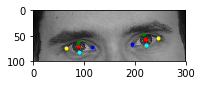

9 _r 1.1 (-5, -5)
eyeWH: 213 71
faceWH: 258 258
faceXY: 380 267
eyeXY: 274 196


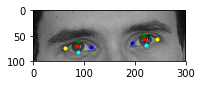

10 _r 1.1 (-5, -5)
eyeWH: 219 73
faceWH: 264 264
faceXY: 406 235
eyeXY: 297 162


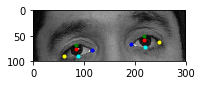

11 _r 1.1 (-5, -5)
eyeWH: 219 73
faceWH: 266 266
faceXY: 408 236
eyeXY: 299 163


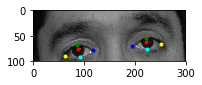

12 _r 1.1 (-5, -5)
eyeWH: 243 81
faceWH: 293 293
faceXY: 355 219
eyeXY: 234 138


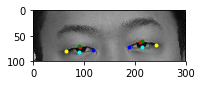

13 _r 1.1 (-5, -5)
eyeWH: 207 69
faceWH: 252 252
faceXY: 380 209
eyeXY: 277 140


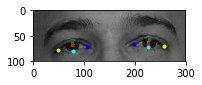

14 _r 1.1 (-5, -5)
eyeWH: 207 69
faceWH: 251 251
faceXY: 370 211
eyeXY: 267 142


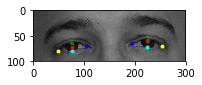

15 _r 1.1 (-5, -5)
eyeWH: 186 62
faceWH: 224 224
faceXY: 386 228
eyeXY: 293 166


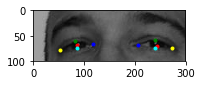

16 _r 1.1 (-5, -5)
eyeWH: 207 69
faceWH: 250 250
faceXY: 425 233
eyeXY: 322 164


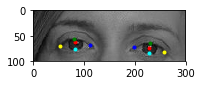

17 _r 1.1 (-5, -5)
eyeWH: 207 69
faceWH: 252 252
faceXY: 415 234
eyeXY: 312 165


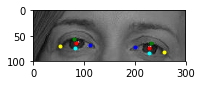

18 _r 1.1 (-5, -5)
eyeWH: 399 133
faceWH: 483 483
faceXY: 265 432
eyeXY: 66 299


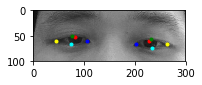

19 _r 1.1 (-5, -5)
eyeWH: 399 133
faceWH: 485 485
faceXY: 269 428
eyeXY: 70 295


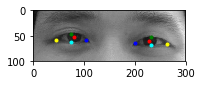

20 _r 1.1 (-5, -5)
eyeWH: 417 139
faceWH: 506 506
faceXY: 268 432
eyeXY: 60 293


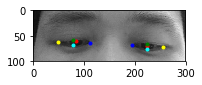

21 _r 1.1 (-5, -5)
eyeWH: 402 134
faceWH: 488 488
faceXY: 263 434
eyeXY: 62 300


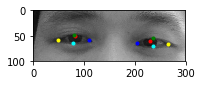

22 _r 1.1 (-5, -5)
eyeWH: 396 132
faceWH: 481 481
faceXY: 269 428
eyeXY: 71 296


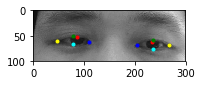

1 _r 1.1 (5, -5)
eyeWH: 285 95
faceWH: 347 347
faceXY: 407 324
eyeXY: 265 229


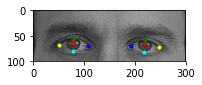

2 _r 1.1 (5, -5)
eyeWH: 297 99
faceWH: 359 359
faceXY: 364 274
eyeXY: 216 175


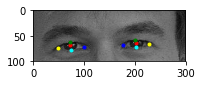

3 _r 1.1 (5, -5)
eyeWH: 225 75
faceWH: 271 271
faceXY: 353 274
eyeXY: 241 199


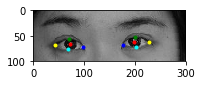

4 _r 1.1 (5, -5)
eyeWH: 234 78
faceWH: 283 283
faceXY: 357 287
eyeXY: 240 209


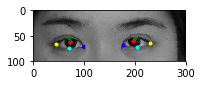

5 _r 1.1 (5, -5)
eyeWH: 324 108
faceWH: 392 392
faceXY: 375 267
eyeXY: 213 159


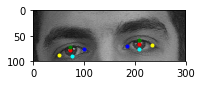

6 _r 1.1 (5, -5)
eyeWH: 258 86
faceWH: 311 311
faceXY: 400 311
eyeXY: 271 225


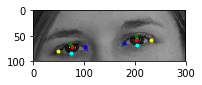

7 _r 1.1 (5, -5)
eyeWH: 252 84
faceWH: 307 307
faceXY: 419 308
eyeXY: 293 224


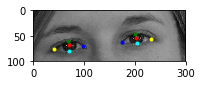

8 _r 1.1 (5, -5)
eyeWH: 216 72
faceWH: 261 261
faceXY: 402 269
eyeXY: 294 197


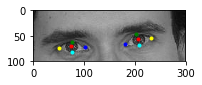

9 _r 1.1 (5, -5)
eyeWH: 213 71
faceWH: 258 258
faceXY: 390 267
eyeXY: 284 196


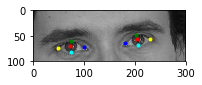

10 _r 1.1 (5, -5)
eyeWH: 219 73
faceWH: 264 264
faceXY: 416 235
eyeXY: 307 162


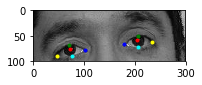

11 _r 1.1 (5, -5)
eyeWH: 219 73
faceWH: 266 266
faceXY: 418 236
eyeXY: 309 163


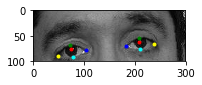

12 _r 1.1 (5, -5)
eyeWH: 243 81
faceWH: 293 293
faceXY: 365 219
eyeXY: 244 138


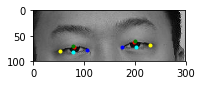

13 _r 1.1 (5, -5)
eyeWH: 207 69
faceWH: 252 252
faceXY: 390 209
eyeXY: 287 140


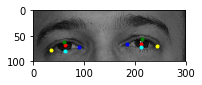

14 _r 1.1 (5, -5)
eyeWH: 207 69
faceWH: 251 251
faceXY: 380 211
eyeXY: 277 142


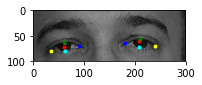

15 _r 1.1 (5, -5)
eyeWH: 186 62
faceWH: 224 224
faceXY: 396 228
eyeXY: 303 166


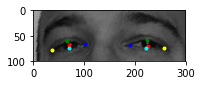

16 _r 1.1 (5, -5)
eyeWH: 207 69
faceWH: 250 250
faceXY: 435 233
eyeXY: 332 164


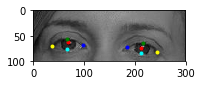

17 _r 1.1 (5, -5)
eyeWH: 207 69
faceWH: 252 252
faceXY: 425 234
eyeXY: 322 165


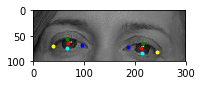

18 _r 1.1 (5, -5)
eyeWH: 399 133
faceWH: 483 483
faceXY: 275 432
eyeXY: 76 299


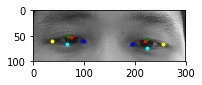

19 _r 1.1 (5, -5)
eyeWH: 399 133
faceWH: 485 485
faceXY: 279 428
eyeXY: 80 295


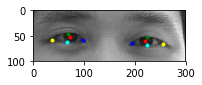

20 _r 1.1 (5, -5)
eyeWH: 417 139
faceWH: 506 506
faceXY: 278 432
eyeXY: 70 293


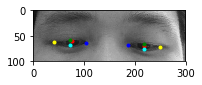

21 _r 1.1 (5, -5)
eyeWH: 402 134
faceWH: 488 488
faceXY: 273 434
eyeXY: 72 300


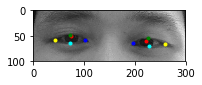

22 _r 1.1 (5, -5)
eyeWH: 396 132
faceWH: 481 481
faceXY: 279 428
eyeXY: 81 296


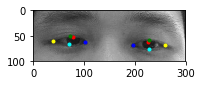

1 _r 1.1 (0, 0)
eyeWH: 285 95
faceWH: 347 347
faceXY: 402 329
eyeXY: 260 234


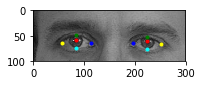

2 _r 1.1 (0, 0)
eyeWH: 297 99
faceWH: 359 359
faceXY: 359 279
eyeXY: 211 180


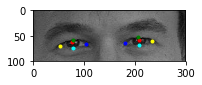

3 _r 1.1 (0, 0)
eyeWH: 225 75
faceWH: 271 271
faceXY: 348 279
eyeXY: 236 204


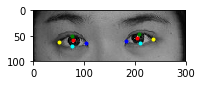

4 _r 1.1 (0, 0)
eyeWH: 234 78
faceWH: 283 283
faceXY: 352 292
eyeXY: 235 214


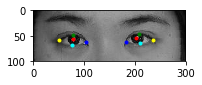

5 _r 1.1 (0, 0)
eyeWH: 324 108
faceWH: 392 392
faceXY: 370 272
eyeXY: 208 164


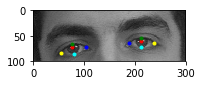

6 _r 1.1 (0, 0)
eyeWH: 258 86
faceWH: 311 311
faceXY: 395 316
eyeXY: 266 230


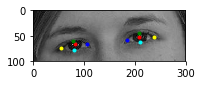

7 _r 1.1 (0, 0)
eyeWH: 252 84
faceWH: 307 307
faceXY: 414 313
eyeXY: 288 229


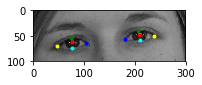

8 _r 1.1 (0, 0)
eyeWH: 216 72
faceWH: 261 261
faceXY: 397 274
eyeXY: 289 202


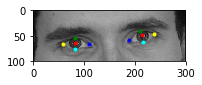

9 _r 1.1 (0, 0)
eyeWH: 213 71
faceWH: 258 258
faceXY: 385 272
eyeXY: 279 201


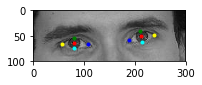

10 _r 1.1 (0, 0)
eyeWH: 219 73
faceWH: 264 264
faceXY: 411 240
eyeXY: 302 167


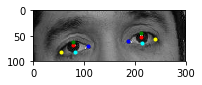

11 _r 1.1 (0, 0)
eyeWH: 219 73
faceWH: 266 266
faceXY: 413 241
eyeXY: 304 168


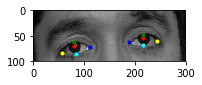

12 _r 1.1 (0, 0)
eyeWH: 243 81
faceWH: 293 293
faceXY: 360 224
eyeXY: 239 143


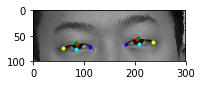

13 _r 1.1 (0, 0)
eyeWH: 207 69
faceWH: 252 252
faceXY: 385 214
eyeXY: 282 145


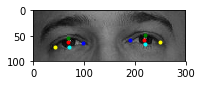

14 _r 1.1 (0, 0)
eyeWH: 207 69
faceWH: 251 251
faceXY: 375 216
eyeXY: 272 147


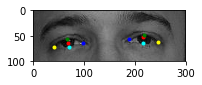

15 _r 1.1 (0, 0)
eyeWH: 186 62
faceWH: 224 224
faceXY: 391 233
eyeXY: 298 171


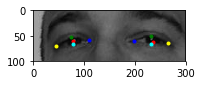

16 _r 1.1 (0, 0)
eyeWH: 207 69
faceWH: 250 250
faceXY: 430 238
eyeXY: 327 169


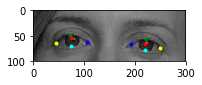

17 _r 1.1 (0, 0)
eyeWH: 207 69
faceWH: 252 252
faceXY: 420 239
eyeXY: 317 170


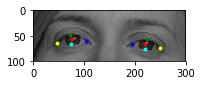

18 _r 1.1 (0, 0)
eyeWH: 399 133
faceWH: 483 483
faceXY: 270 437
eyeXY: 71 304


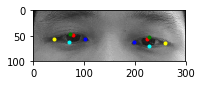

19 _r 1.1 (0, 0)
eyeWH: 399 133
faceWH: 485 485
faceXY: 274 433
eyeXY: 75 300


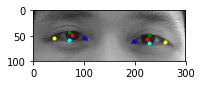

20 _r 1.1 (0, 0)
eyeWH: 417 139
faceWH: 506 506
faceXY: 273 437
eyeXY: 65 298


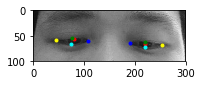

21 _r 1.1 (0, 0)
eyeWH: 402 134
faceWH: 488 488
faceXY: 268 439
eyeXY: 67 305


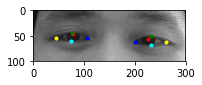

22 _r 1.1 (0, 0)
eyeWH: 396 132
faceWH: 481 481
faceXY: 274 433
eyeXY: 76 301


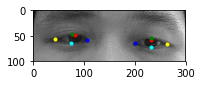

1 _r 1.1 (-5, 5)
eyeWH: 285 95
faceWH: 347 347
faceXY: 397 334
eyeXY: 255 239


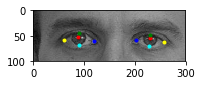

2 _r 1.1 (-5, 5)
eyeWH: 297 99
faceWH: 359 359
faceXY: 354 284
eyeXY: 206 185


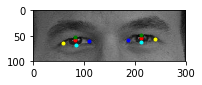

3 _r 1.1 (-5, 5)
eyeWH: 225 75
faceWH: 271 271
faceXY: 343 284
eyeXY: 231 209


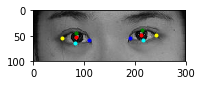

4 _r 1.1 (-5, 5)
eyeWH: 234 78
faceWH: 283 283
faceXY: 347 297
eyeXY: 230 219


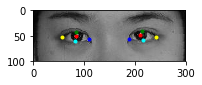

5 _r 1.1 (-5, 5)
eyeWH: 324 108
faceWH: 392 392
faceXY: 365 277
eyeXY: 203 169


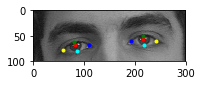

6 _r 1.1 (-5, 5)
eyeWH: 258 86
faceWH: 311 311
faceXY: 390 321
eyeXY: 261 235


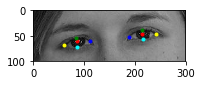

7 _r 1.1 (-5, 5)
eyeWH: 252 84
faceWH: 307 307
faceXY: 409 318
eyeXY: 283 234


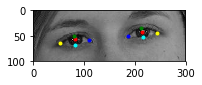

8 _r 1.1 (-5, 5)
eyeWH: 216 72
faceWH: 261 261
faceXY: 392 279
eyeXY: 284 207


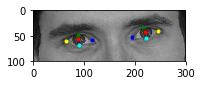

9 _r 1.1 (-5, 5)
eyeWH: 213 71
faceWH: 258 258
faceXY: 380 277
eyeXY: 274 206


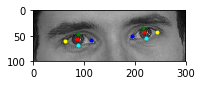

10 _r 1.1 (-5, 5)
eyeWH: 219 73
faceWH: 264 264
faceXY: 406 245
eyeXY: 297 172


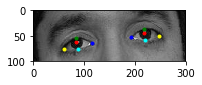

11 _r 1.1 (-5, 5)
eyeWH: 219 73
faceWH: 266 266
faceXY: 408 246
eyeXY: 299 173


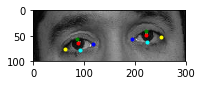

12 _r 1.1 (-5, 5)
eyeWH: 243 81
faceWH: 293 293
faceXY: 355 229
eyeXY: 234 148


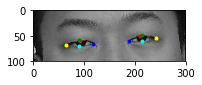

13 _r 1.1 (-5, 5)
eyeWH: 207 69
faceWH: 252 252
faceXY: 380 219
eyeXY: 277 150


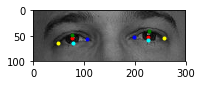

14 _r 1.1 (-5, 5)
eyeWH: 207 69
faceWH: 251 251
faceXY: 370 221
eyeXY: 267 152


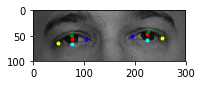

15 _r 1.1 (-5, 5)
eyeWH: 186 62
faceWH: 224 224
faceXY: 386 238
eyeXY: 293 176


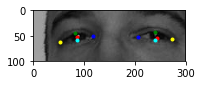

16 _r 1.1 (-5, 5)
eyeWH: 207 69
faceWH: 250 250
faceXY: 425 243
eyeXY: 322 174


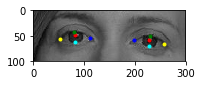

17 _r 1.1 (-5, 5)
eyeWH: 207 69
faceWH: 252 252
faceXY: 415 244
eyeXY: 312 175


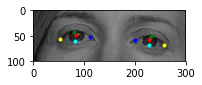

18 _r 1.1 (-5, 5)
eyeWH: 399 133
faceWH: 483 483
faceXY: 265 442
eyeXY: 66 309


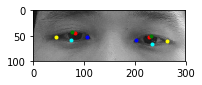

19 _r 1.1 (-5, 5)
eyeWH: 399 133
faceWH: 485 485
faceXY: 269 438
eyeXY: 70 305


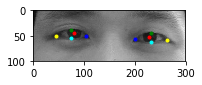

20 _r 1.1 (-5, 5)
eyeWH: 417 139
faceWH: 506 506
faceXY: 268 442
eyeXY: 60 303


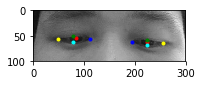

21 _r 1.1 (-5, 5)
eyeWH: 402 134
faceWH: 488 488
faceXY: 263 444
eyeXY: 62 310


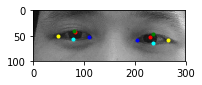

22 _r 1.1 (-5, 5)
eyeWH: 396 132
faceWH: 481 481
faceXY: 269 438
eyeXY: 71 306


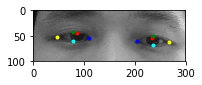

1 _r 1.1 (5, 5)
eyeWH: 285 95
faceWH: 347 347
faceXY: 407 334
eyeXY: 265 239


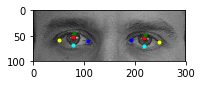

2 _r 1.1 (5, 5)
eyeWH: 297 99
faceWH: 359 359
faceXY: 364 284
eyeXY: 216 185


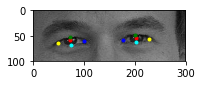

3 _r 1.1 (5, 5)
eyeWH: 225 75
faceWH: 271 271
faceXY: 353 284
eyeXY: 241 209


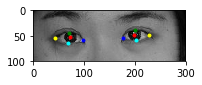

4 _r 1.1 (5, 5)
eyeWH: 234 78
faceWH: 283 283
faceXY: 357 297
eyeXY: 240 219


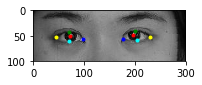

5 _r 1.1 (5, 5)
eyeWH: 324 108
faceWH: 392 392
faceXY: 375 277
eyeXY: 213 169


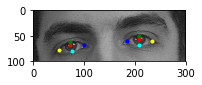

6 _r 1.1 (5, 5)
eyeWH: 258 86
faceWH: 311 311
faceXY: 400 321
eyeXY: 271 235


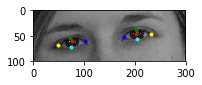

7 _r 1.1 (5, 5)
eyeWH: 252 84
faceWH: 307 307
faceXY: 419 318
eyeXY: 293 234


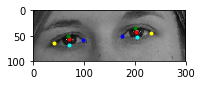

8 _r 1.1 (5, 5)
eyeWH: 216 72
faceWH: 261 261
faceXY: 402 279
eyeXY: 294 207


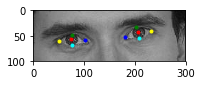

9 _r 1.1 (5, 5)
eyeWH: 213 71
faceWH: 258 258
faceXY: 390 277
eyeXY: 284 206


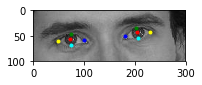

10 _r 1.1 (5, 5)
eyeWH: 219 73
faceWH: 264 264
faceXY: 416 245
eyeXY: 307 172


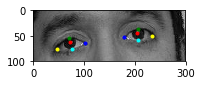

11 _r 1.1 (5, 5)
eyeWH: 219 73
faceWH: 266 266
faceXY: 418 246
eyeXY: 309 173


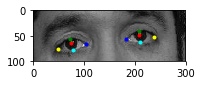

12 _r 1.1 (5, 5)
eyeWH: 243 81
faceWH: 293 293
faceXY: 365 229
eyeXY: 244 148


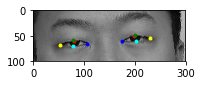

13 _r 1.1 (5, 5)
eyeWH: 207 69
faceWH: 252 252
faceXY: 390 219
eyeXY: 287 150


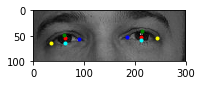

14 _r 1.1 (5, 5)
eyeWH: 207 69
faceWH: 251 251
faceXY: 380 221
eyeXY: 277 152


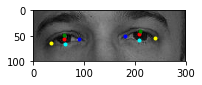

15 _r 1.1 (5, 5)
eyeWH: 186 62
faceWH: 224 224
faceXY: 396 238
eyeXY: 303 176


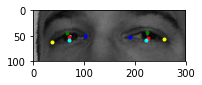

16 _r 1.1 (5, 5)
eyeWH: 207 69
faceWH: 250 250
faceXY: 435 243
eyeXY: 332 174


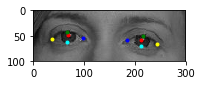

17 _r 1.1 (5, 5)
eyeWH: 207 69
faceWH: 252 252
faceXY: 425 244
eyeXY: 322 175


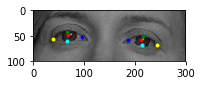

18 _r 1.1 (5, 5)
eyeWH: 399 133
faceWH: 483 483
faceXY: 275 442
eyeXY: 76 309


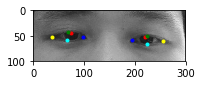

19 _r 1.1 (5, 5)
eyeWH: 399 133
faceWH: 485 485
faceXY: 279 438
eyeXY: 80 305


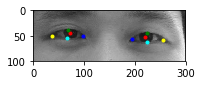

20 _r 1.1 (5, 5)
eyeWH: 417 139
faceWH: 506 506
faceXY: 278 442
eyeXY: 70 303


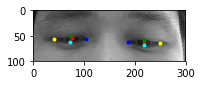

21 _r 1.1 (5, 5)
eyeWH: 402 134
faceWH: 488 488
faceXY: 273 444
eyeXY: 72 310


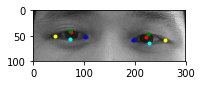

22 _r 1.1 (5, 5)
eyeWH: 396 132
faceWH: 481 481
faceXY: 279 438
eyeXY: 81 306


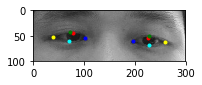

In [42]:
for r in range(2):
    for z in range(3):
        for xy in range(5):
            for n in range(22):
                
                str_r = rs[r]
                zoom = zooms[z]
                offset = offsets[xy]
                print(n+1, str_r, zoom, offset)
                if n<9:
                    name = '../data/images/00' + str(n+1) + str_r
                else:
                    name = '../data/images/0' + str(n+1) + str_r
                flag = None
                flag = getFlag4Json(name + '.jpg.json')
                image = getImage(name + '.jpg')
                face = getFace4Image(name + '.jpg')
                eyeGray, eyeFlag = getEyeDataFlag(image, face, flag, zoom=zoom, offset=offset)
                if n<9:
                    name = '../data/eye/00' + str(n+1) + str_r
                else:
                    name = '../data/eye/0' + str(n+1) + str_r
                eyeGray.save(name + '_' + str(zoom) + '_' + str(xy) + '.jpg', 'JPEG')

                eyeData = np.array(eyeGray)
                label = []
                label.clear()
                if eyeFlag != None:
                    value_list = list(eyeFlag.values())
                    for i in range(10):
                        label.append(value_list[i*2])
                        label.append(value_list[i*2+1])
                img_string = ' '.join(str(s) for s in eyeData[0])
                data_list.append(img_string)
                label_list.append(label)
data2csv(data_list, label_list)


In [ ]:
flag = getFlag4Json('../data/images/001.jpg.json')


eye,x,y,w,h = getEye4Image('../data/images/001.jpg',zoom=(280,90))
displayEye(eye, flag, x, y, w, h,zoom=(280,90))
eye_lr = eye.transpose(Image.FLIP_LEFT_RIGHT)
displayEye(eye_lr, flag, x, y, w, h,zoom=(280,90),transpose=True)

eye,x,y,w,h = getEye4Image('../data/images/001.jpg',zoom=(300,100))
displayEye(eye, flag, x, y, w, h,zoom=(300,100))

eye,x,y,w,h = getEye4Image('../data/images/001.jpg',zoom=(320,110))
displayEye(eye, flag, x, y, w, h,zoom=(320,110))


# print(list(flag[0]))
# print(list(flag[0].values()))
# print(flag['ROX'])
zoom = (300, 100)
print(zoom[0])